# **DATA SCIENCE PROJECT:NO CHURN TELECOM**

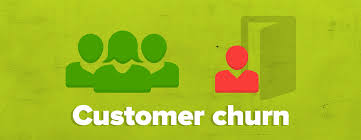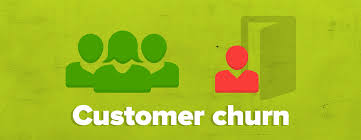

## **BUSINESS CASE: PREDICT WHETHER A CUSTOMER WILL CHURN (LEAVE THE SERVICE) OR NOT.**

## **TASK: CLASSIFICATION**

## **INTRODUCTION OF PROJECT**:

* No-Churn Telecom is an established Telecom operator in Europe with more than a decade in Business. Due to new players in the
market, telecom industry has become very competitive and retaining customers becoming a challenge.

 * In spite of No-Churn initiatives of reducing tariffs and promoting more offers, the churn rate (percentage of customers migrating to competitors) is well above 10%. 

* No-Churn wants to explore possibility of Machine Learning to help with following use cases to retain competitive edge in the industry.


## **PROJECT GOAL**:

#### 1. Understanding the variables that are influencing the customers to migrate.



#### 2. Creating Churn risk scores that can be indicative to drive retention campaigns.

#### 3. Introduce new predicting variable “CHURN-FLAG” with values YES(1) or NO(0) so that email campaigns with lucrative offers be targeted to Churn YES customers.

## **PROJECT IS DEVICE INTO CERTAIN STEPS:**

**1.Fetching data from data-base.**

**2.Domain Analysis.**

**3.EDA: [Univariate, Bivariate analysis condition]**

**4.Data preprocessing/Feature Engineering.**

**5.Features Selection.**

**6.Model Creation.**

**7.Model Evaluation.**

**8.Model Comparison.**

**9.Conclusion**

## **IMPORTING NECESSARY LIBRARY**

## **MAKING CONNECTION TO DATA BASE SERVER**

In [240]:
connection = mysql.connector.connect(host ='18.136.157.135', # IP-address of data-base
                                    user = 'dm_team3', # data-base Username
                                    password ='DM!$!Team!27@9!20&',
                                    database ='project_telecom') # data-base Password

## **FETCHING DATA FROM DATA BASE**

In [241]:
## Check the number of databases available on the server
cursor=connection.cursor()
cursor.execute('show databases')
for i in cursor:
    print(i)

('information_schema',)
('project_telecom',)


## **READING TABLE FROM SQL DATABASE**

In [243]:
query = "select * from telecom_churn_data" # SQL statement
data = pd.read_sql(query,connection)
data

,columns1,columns2,columns3,columns4,columns5,columns6,columns7,columns8,columns9,columns10,...,columns12,columns13,columns14,columns15,columns16,columns17,columns18,columns19,columns20,columns21
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,...,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,...,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,...,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,...,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


In [45]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   columns1   4617 non-null   object
 1   columns2   4617 non-null   object
 2   columns3   4617 non-null   object
 3   columns4   4617 non-null   object
 4   columns5   4617 non-null   object
 5   columns6   4617 non-null   object
 6   columns7   4617 non-null   object
 7   columns8   4617 non-null   object
 8   columns9   4617 non-null   object
 9   columns10  4617 non-null   object
 10  columns11  4617 non-null   object
 11  columns12  4617 non-null   object
 12  columns13  4617 non-null   object
 13  columns14  4617 non-null   object
 14  columns15  4617 non-null   object
 15  columns16  4617 non-null   object
 16  columns17  4617 non-null   object
 17  columns18  4617 non-null   object
 18  columns19  4617 non-null   object
 19  columns20  4617 non-null   object
 20  columns21  4617 non-null   obj

## RENAMING THE COLUMNS

In [249]:
import pandas as pd

# Assuming df is your DataFrame
new_column_names = {
    'columns1': 'State',
    'columns2': 'Account_Length',
    'columns3': 'Area_Code',
    'columns4': 'Phone',
    'columns5': 'International_Plan',
    'columns6': 'VMail_Plan',
    'columns7': 'VMail_Message',
    'columns8': 'Day_Mins',
    'columns9': 'Day_Calls',
    'columns10': 'Day_Charge',
    'columns11': 'Eve_Mins',
    'columns12': 'Eve_Calls',
    'columns13': 'Eve_Charge',
    'columns14': 'Night_Mins',
    'columns15': 'Night_Calls',
    'columns16': 'Night_Charge',
    'columns17': 'International_Mins',
    'columns18': 'International_calls',
    'columns19': 'International_Charge',
    'columns20': 'CustServ_Calls',
    'columns21': 'Churn',
}

data.rename(columns=new_column_names, inplace=True)


In [250]:
data

,State,Account_Length,Area_Code,Phone,International_Plan,VMail_Plan,VMail_Message,Day_Mins,Day_Calls,Day_Charge,...,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,...,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,...,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,...,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,...,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


# **DOMAIN ANALYSIS**

- **State** - 2-letter code of the US state of customer residence.
- **Account Length** - Number of months the customer has been with the current telco provider.
- **Area Code** - 3 digit area code.
- **Phone** - Phone number of customer.
- **International Plan** - The customer has international plan or not.
- **VMail Plan** - The customer has voice mail plan or not.
- **VMail Message** - Number of voice-mail messages.
- **Day Mins** - Total minutes of day calls.
- **Day Calls** - Total number of day calls.
- **Day Charge** - Total charge of day calls.
- **Eve Mins** - Total minutes of evening calls.
- **Eve Calls** - Total number of evening calls.
- **Eve Charge** - Total charge of evening calls.
- **Night Mins** - Total minutes of night calls.
- **Night Calls** - Total number of night calls.
- **Night Charge** - Total charge of night calls.
- **International Mins** - Total minutes of international calls.
- **International calls** - Total number of international calls.
- **International Charge** - Total charge of international calls.
- **CustServ Calls** - Number of calls to customer service.
- **Churn** - Customer churn or not. (target variable)

## **BASIC CHECKS**

In [251]:
data.head()

,State,Account_Length,Area_Code,Phone,International_Plan,VMail_Plan,VMail_Message,Day_Mins,Day_Calls,Day_Charge,...,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


In [252]:
data.tail()

,State,Account_Length,Area_Code,Phone,International_Plan,VMail_Plan,VMail_Message,Day_Mins,Day_Calls,Day_Charge,...,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,Churn
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,...,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,...,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,...,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,...,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.
4616,IN,140,415,409-6884,no,no,0,204.7,100,34.8,...,107,10.78,202.8,115,9.13,12.1,4,3.27,2,False.


In [253]:
data.shape

(4617, 21)

* This dataset contains 4617 observations with 21 features.

In [254]:
data.columns

Index(['State', 'Account_Length', 'Area_Code', 'Phone', 'International_Plan',
       'VMail_Plan', 'VMail_Message', 'Day_Mins', 'Day_Calls', 'Day_Charge',
       'Eve_Mins', 'Eve_Calls', 'Eve_Charge', 'Night_Mins', 'Night_Calls',
       'Night_Charge', 'International_Mins', 'International_calls',
       'International_Charge', 'CustServ_Calls', 'Churn'],
      dtype='object')

* Total 21 features are present in this dataset including target variable i.e Churn

In [255]:
data.dtypes

State                   object
Account_Length          object
Area_Code               object
Phone                   object
International_Plan      object
VMail_Plan              object
VMail_Message           object
Day_Mins                object
Day_Calls               object
Day_Charge              object
Eve_Mins                object
Eve_Calls               object
Eve_Charge              object
Night_Mins              object
Night_Calls             object
Night_Charge            object
International_Mins      object
International_calls     object
International_Charge    object
CustServ_Calls          object
Churn                   object
dtype: object

In [256]:
data.info()#Information about the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   State                 4617 non-null   object
 1   Account_Length        4617 non-null   object
 2   Area_Code             4617 non-null   object
 3   Phone                 4617 non-null   object
 4   International_Plan    4617 non-null   object
 5   VMail_Plan            4617 non-null   object
 6   VMail_Message         4617 non-null   object
 7   Day_Mins              4617 non-null   object
 8   Day_Calls             4617 non-null   object
 9   Day_Charge            4617 non-null   object
 10  Eve_Mins              4617 non-null   object
 11  Eve_Calls             4617 non-null   object
 12  Eve_Charge            4617 non-null   object
 13  Night_Mins            4617 non-null   object
 14  Night_Calls           4617 non-null   object
 15  Night_Charge          4617 non-null   

### CONVERT INTO DATA TYPES: 

In [257]:
data['State'] = data['State'].astype('object')
data['Account_Length'] = data['Account_Length'].astype('int64')
data['Area_Code'] = data['Area_Code'].astype('int64')
data['Phone'] = data['Phone'].astype('object')
data['International_Plan'] = data['International_Plan'].astype('object')
data['VMail_Plan'] = data['VMail_Plan'].astype('object')
data['VMail_Message'] = data['VMail_Message'].astype('int64')
data['Day_Mins'] = data['Day_Mins'].astype('float64')
data['Day_Calls'] = data['Day_Calls'].astype('int64')
data['Day_Charge'] = data['Day_Charge'].astype('float64')
data['Eve_Mins'] = data['Eve_Mins'].astype('float64')  # Repeat for other columns
data['Eve_Calls'] = data['Eve_Calls'].astype('int64')  # Repeat for other columns
data['Eve_Charge'] = data['Eve_Charge'].astype('float64')  # Repeat for other columns
data['Night_Mins'] = data['Night_Mins'].astype('float64')  # Repeat for other columns
data['Night_Calls'] = data['Night_Calls'].astype('int64')  # Repeat for other columns
data['Night_Charge'] = data['Night_Charge'].astype('float64')  # Repeat for other columns
data['International_Mins'] = data['International_Mins'].astype('float64')  # Repeat for other columns
data['International_calls'] = data['International_calls'].astype('int64')  # Repeat for other columns
data['International_Charge'] = data['International_Charge'].astype('float64')  # Repeat for other columns
data['CustServ_Calls'] = data['CustServ_Calls'].astype('int64')
data['Churn'] = data['Churn'].astype('object')

# Print the DataFrame info
print(pd.DataFrame(data).info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   State                 4617 non-null   object 
 1   Account_Length        4617 non-null   int64  
 2   Area_Code             4617 non-null   int64  
 3   Phone                 4617 non-null   object 
 4   International_Plan    4617 non-null   object 
 5   VMail_Plan            4617 non-null   object 
 6   VMail_Message         4617 non-null   int64  
 7   Day_Mins              4617 non-null   float64
 8   Day_Calls             4617 non-null   int64  
 9   Day_Charge            4617 non-null   float64
 10  Eve_Mins              4617 non-null   float64
 11  Eve_Calls             4617 non-null   int64  
 12  Eve_Charge            4617 non-null   float64
 13  Night_Mins            4617 non-null   float64
 14  Night_Calls           4617 non-null   int64  
 15  Night_Charge         

**OBSERVATION**:-

* The DataFrame has 4617 entries (rows) and 21 columns.
* Object: State, Phone, International_Plan, VMail_Plan, Churn
* Int64: Account_Length, Area_Code, VMail_Message, Day_Calls, Eve_Calls, Night_Calls, International_calls, CustServ_Calls
* Float64: Day_Mins, Day_Charge, Eve_Mins, Eve_Charge, Night_Mins, Night_Charge, International_Mins, International_Charge
* All columns have 4617 non-null entries, indicating that there are no missing values in any column.


In [258]:
#Checking if there is some null values or not
data.isnull().sum()

State                   0
Account_Length          0
Area_Code               0
Phone                   0
International_Plan      0
VMail_Plan              0
VMail_Message           0
Day_Mins                0
Day_Calls               0
Day_Charge              0
Eve_Mins                0
Eve_Calls               0
Eve_Charge              0
Night_Mins              0
Night_Calls             0
Night_Charge            0
International_Mins      0
International_calls     0
International_Charge    0
CustServ_Calls          0
Churn                   0
dtype: int64

### STASTICAL MEASURE OF DATA

In [259]:
data.describe()

,Account_Length,Area_Code,VMail_Message,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls
count,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000
mean,100.645224,437.046350,7.849903,180.447152,100.054364,30.676576,200.429088,100.179770,17.036703,200.623933,99.944120,9.028185,10.279294,4.433831,2.775926,1.567035
std,39.597194,42.288212,13.592333,53.983540,19.883027,9.177145,50.557001,19.821314,4.297332,50.543616,19.935053,2.274488,2.757361,2.457615,0.744413,1.307019
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,12.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,165.900000,87.000000,14.100000,167.100000,87.000000,7.520000,8.600000,3.000000,2.320000,1.000000
50%,100.000000,415.000000,0.000000,180.000000,100.000000,30.600000,200.800000,101.000000,17.070000,200.800000,100.000000,9.040000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,17.000000,216.800000,113.000000,36.860000,234.000000,114.000000,19.890000,234.900000,113.000000,10.570000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


### INSIGHTS:-
* There is no null value in any column
* The mean value for the "Area_Code" is 437.046350, which is higher compared to the other features in the dataset.
* The standard deviation for the "Day_Mins" feature is 53.983540, which is higher compared to the standard deviations of other features in the dataset.
* In the context of the dataset, having a value of 0 for VMail_Message, Day_Mins, Day_Calls, Day_Charge,Eve_Mins,	Eve_Calls,	Eve_Charge,International_Mins, International_calls,	International_Charge,CustServ_Calls	 does not necessarily indicate corrupt data. It could simply mean that some customers did not receive any   during the observed period.
* 25th percentile (Q1), 50th percentile (Q2), 75th percentile (Q3)
* The maximum value for the "Area_Code" column is 510.000000, which is higher than the other values in the dataset.

### INSIGHTS:-


* Account Length:
The average account length is approximately 100.65 months, with a minimum of 1 month and a maximum of 243 months.
The distribution is relatively spread out, with a standard deviation of approximately 39.60.

* Area Code:
The area codes in the dataset range from 408 to 510.
The most common area code appears to be around 415, as it falls within the 50th percentile (median).

* Voicemail Messages:
On average, customers receive around 7.85 voicemail messages, with a maximum of 51.
The majority of customers (at least 75%) have either no voicemail messages or a small number of them.

* Day Usage:
Average day minutes used is 180.45, with a minimum of 0 and a maximum of 351.5.
Average number of day calls is 100.05.
The average charge for daytime usage is $30.68.

* Evening Usage:
Average evening minutes used is 200.43, with a minimum of 0 and a maximum of 363.7.
Average number of evening calls is 100.18.
The average charge for evening usage is $17.04.

* Night Usage:
Average night minutes used is 200.62, with a minimum of 23.2 and a maximum of 395.
Average number of night calls is 99.94.
The average charge for nighttime usage is $9.03.

* International Usage:
Average international minutes used is 10.28, with a minimum of 0 and a maximum of 20.
Average number of international calls is 4.43.
The average charge for international usage is $2.78.

* Customer Service Calls:
On average, customers make approximately 1.57 calls to customer service, with a maximum of 9.

In [260]:
data.State.value_counts()

State
WV    149
AL    114
MN    112
OH    110
ID    110
VA    109
NY    109
OR    107
NJ    106
WY    106
TX    105
UT    104
WI     99
MI     98
MA     97
KS     96
VT     95
ME     95
CT     92
MD     92
MT     92
MS     91
NH     91
CO     91
KY     90
RI     90
NV     89
IN     89
DE     89
WA     89
FL     85
NM     84
MO     84
SC     83
NC     83
TN     83
DC     82
AZ     81
ND     80
OK     80
HI     79
NE     79
IL     79
AR     77
GA     77
SD     76
LA     73
AK     69
PA     68
IA     65
CA     44
Name: count, dtype: int64

In [261]:
data.Account_Length.value_counts()

Account_Length
90     63
87     56
105    54
93     54
112    53
       ..
200     1
2       1
215     1
199     1
233     1
Name: count, Length: 218, dtype: int64

In [54]:

data.Area_Code.value_counts()

Area_Code
415    2299
408    1161
510    1157
Name: count, dtype: int64

In [55]:
data.Phone.value_counts()

Phone
 382-4657    1
 359-5091    1
 347-3895    1
 371-9414    1
 415-8200    1
            ..
 353-6038    1
 341-7686    1
 384-8723    1
 328-2982    1
 409-6884    1
Name: count, Length: 4617, dtype: int64

In [56]:
data.International_Plan.value_counts()

International_Plan
 no     4171
 yes     446
Name: count, dtype: int64

In [57]:
data.VMail_Plan.value_counts()

VMail_Plan
 no     3381
 yes    1236
Name: count, dtype: int64

In [58]:
data.VMail_Message.value_counts()

VMail_Message
0     3381
31      80
29      64
28      62
33      61
24      57
27      57
26      55
30      54
32      52
25      49
23      48
22      45
36      45
37      42
39      40
35      40
21      40
34      39
38      37
20      30
19      26
40      26
41      21
42      19
17      18
16      16
18      14
43      13
15      12
12      10
45      10
14       9
46       8
44       7
10       4
47       4
13       4
48       3
49       3
9        2
50       2
6        2
8        2
11       2
4        1
51       1
Name: count, dtype: int64

In [59]:
data.Day_Mins.value_counts()

Day_Mins
154.0    10
189.3    10
177.1     9
159.5     9
184.5     9
         ..
255.3     1
41.9      1
239.4     1
113.1     1
127.5     1
Name: count, Length: 1901, dtype: int64

In [60]:
data.Day_Calls.value_counts()

Day_Calls
102    108
105    106
95     101
97      98
108     97
      ... 
30       1
35       1
165      1
163      1
46       1
Name: count, Length: 123, dtype: int64

In [61]:
data.Day_Charge.value_counts()

Day_Charge
26.18    10
32.18    10
30.11     9
27.12     9
31.37     9
         ..
43.40     1
7.12      1
40.70     1
19.23     1
21.68     1
Name: count, Length: 1901, dtype: int64

In [62]:
data.Eve_Mins.value_counts()

Eve_Mins
169.9    10
230.9     9
187.5     9
167.6     9
161.7     9
         ..
139.8     1
88.7      1
239.1     1
140.0     1
296.1     1
Name: count, Length: 1833, dtype: int64

In [63]:
data.Eve_Calls.value_counts()

Eve_Calls
105    111
97     101
103     99
94      99
101     98
      ... 
12       1
49       1
37       1
42       1
169      1
Name: count, Length: 125, dtype: int64

In [64]:
data.Eve_Charge.value_counts()

Eve_Charge
14.25    15
16.12    14
15.90    14
18.79    13
18.96    11
         ..
23.01     1
25.38     1
20.89     1
25.59     1
25.17     1
Name: count, Length: 1621, dtype: int64

In [65]:
data.Night_Mins.value_counts()

Night_Mins
194.3    10
214.6    10
188.2    10
186.2    10
214.7     9
         ..
118.5     1
284.7     1
139.5     1
269.6     1
124.4     1
Name: count, Length: 1813, dtype: int64

In [66]:
data.Night_Calls.value_counts()

Night_Calls
105    115
102    102
104    101
100    100
91      97
      ... 
164      1
36       1
44       1
33       1
43       1
Name: count, Length: 130, dtype: int64

In [67]:
data.Night_Charge.value_counts()

Night_Charge
9.66     19
8.47     18
10.80    17
8.15     17
9.40     16
         ..
15.56     1
12.32     1
13.29     1
4.92      1
5.60      1
Name: count, Length: 1012, dtype: int64

In [68]:
data.International_Mins.value_counts()

International_Mins
9.8     81
11.1    81
10.0    77
11.3    77
10.1    75
        ..
17.9     1
17.1     1
1.3      1
2.7      1
19.7     1
Name: count, Length: 168, dtype: int64

In [69]:
data.International_calls.value_counts()

International_calls
3     925
4     881
2     680
5     646
6     460
7     283
1     245
8     156
9     141
10     70
11     38
0      23
12     21
13     19
15      9
14      6
16      6
18      4
19      2
20      1
17      1
Name: count, dtype: int64

In [70]:
data.International_Charge.value_counts()

International_Charge
2.65    81
3.00    81
2.70    77
3.05    77
2.73    75
        ..
4.83     1
4.62     1
0.35     1
0.73     1
5.32     1
Name: count, Length: 168, dtype: int64

In [71]:
data.CustServ_Calls.value_counts()

CustServ_Calls
1    1651
2    1031
0     951
3     616
4     234
5      89
6      28
7      13
9       2
8       2
Name: count, dtype: int64

In [72]:
data.Churn.value_counts()

Churn
 False.    3961
 True.      656
Name: count, dtype: int64

### **REMOVE UNWANTED COLUMNS** 


**State**: state information is not relevant to our analysis.

**Area_Code**:-Contains three distinct values: 415, 408, and 510.May not provide significant information if the area code is not relevant to your analysis.

**Phone**:-Contains unique values for each customer. Likely serves as a unique identifier and does not contribute much to the analysis.

**VMail_Message**: The majority of values are 0, indicating that most customers do not have voicemail messages. May not provide significant information if voicemail messages are not a key factor in your analysis.

In [262]:
data.drop('State', axis=1,inplace=True)

In [263]:
data.drop('Area_Code', axis=1,inplace=True)

In [264]:
data.drop('Phone', axis=1,inplace=True)

In [265]:
data.drop('VMail_Message', axis=1,inplace=True)

In [266]:
data

,Account_Length,International_Plan,VMail_Plan,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,Churn
0,128,no,yes,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.
1,107,no,yes,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False.
2,137,no,no,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False.
3,84,yes,no,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,75,yes,no,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,57,no,yes,144.0,81,24.48,187.2,112,15.91,158.6,122,7.14,8.5,6,2.30,3,False.
4613,177,no,yes,189.0,91,32.13,303.1,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,67,no,yes,127.5,126,21.68,296.1,129,25.17,200.9,91,9.04,13.0,3,3.51,1,False.
4615,98,no,yes,168.9,98,28.71,226.3,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


# **EXPLORATORY DATA ANALYSIS**


## UNIVARIATE ANALYSIS

In [231]:
import sweetviz as sv # library for univariate analysis

my_report = sv.analyze(data) ## pass the original dataframe

my_report.show_html() # Default arguments will generate to "SWEETVIZ_REPORT.html"

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [38]:

data.columns

Index(['Account_Length', 'International_Plan', 'VMail_Plan', 'Day_Mins',
       'Day_Calls', 'Day_Charge', 'Eve_Mins', 'Eve_Calls', 'Eve_Charge',
       'Night_Mins', 'Night_Calls', 'Night_Charge', 'International_Mins',
       'International_calls', 'International_Charge', 'CustServ_Calls',
       'Churn'],
      dtype='object')

#### INSIGHTS:-


* Account_Length:- The data for Account_Length follows a normal distribution. 
* International_Plan:- It has Categorical value eg. no,yes
* VMail_Plan:-It has Categorical value eg. no,yes
* Day_Mins:-The data for Day_Mins follows a normal distribution.
* Day_Calls:-The data for Day_Calls follows a normal distribution.
* Day_Charge:-The data for Day_Charge follows a normal distribution.
* Eve_Mins:-The data for Eve_Mins follows a normal distribution.
* Eve_Calls:-The data for Eve_Calls follows a normal distribution.
* Eve_Charge:-The data for Eve_Charge follows a normal distribution.
* Night_Mins:-The data for Night_Mins follows a normal distribution.
* Night_Calls:-The data for Night_Calls follows a normal distribution.
* Night_Charge:-The data for Night_Charge follows a normal distribution.
* International_Mins:-The data for International_Mins follows a normal distribution.
* International_calls:-Highly skewed=1.37
* International_Charge:-The data for International_Charge follows a normal distribution.
* CustServ_Calls:-It has descreate values
* Churn:-It has Categorical value eg. False,True

## USING HISTOGRAM 


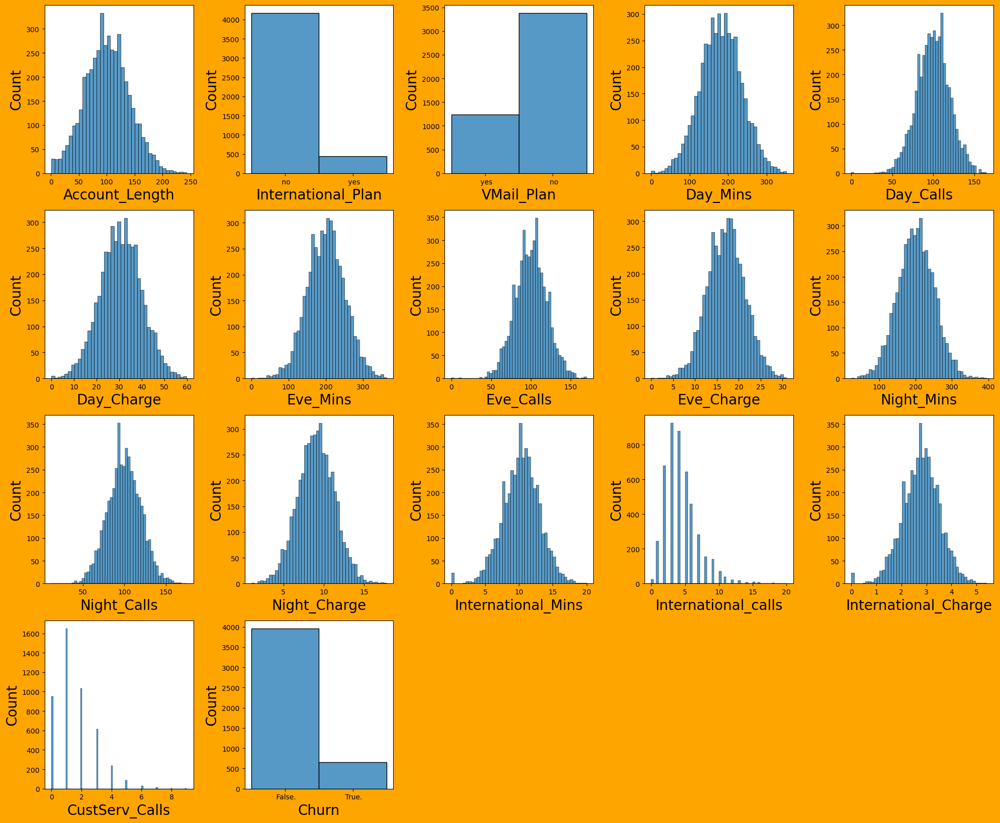

In [79]:
plt.figure(figsize=(20,20), facecolor='orange')

plotnumber=1

for column in data:
    ax = plt.subplot(5,5,plotnumber)
    sns.histplot(data[column])
    plt.xlabel(column,fontsize=20)
    plt.ylabel('Count',fontsize=20)
    plotnumber+=1

plt.tight_layout()

#### INSIGHTS:-
* The histograms help analyze the count or frequency of values in each feature, providing insights into the data's central tendencies and potential patterns. You can see the graphs showing the counts of all columns.

## USING COUNTPLOT

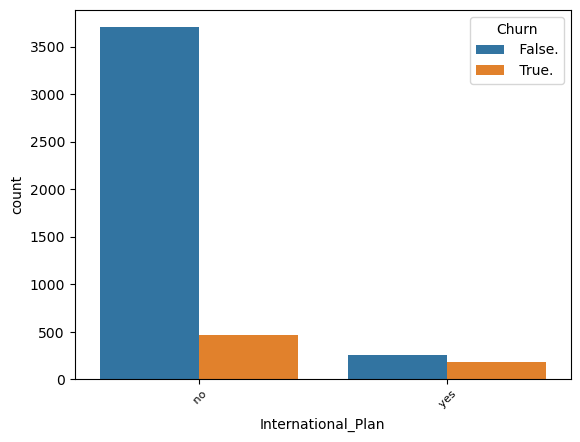

In [80]:
sns.countplot(x='International_Plan',hue='Churn',data=data)
plt.xticks(rotation=45, fontsize=8)
plt.show()

#### INSIGHTS:- 
* International_Plan of  no has high chance of false Churn and  International_Plan of yes also show chances of false Churn.

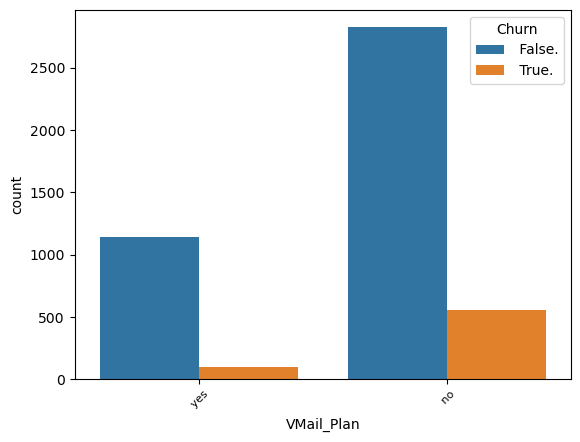

In [81]:
sns.countplot(x='VMail_Plan',hue='Churn',data=data)
plt.xticks(rotation=45, fontsize=8)
plt.show()

### INSIGHTS:-
* VMail_Plan of yes and no has high chnaces of getting false Churn

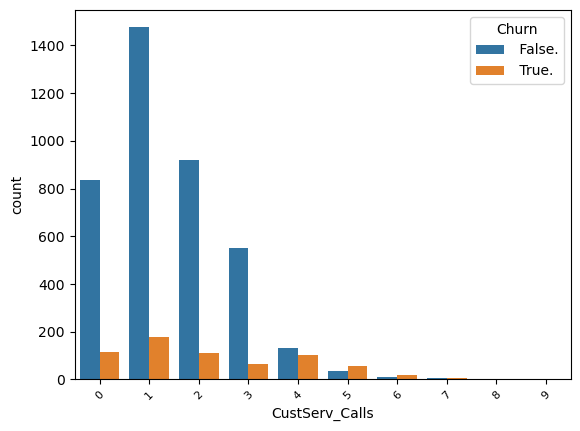

In [82]:
sns.countplot(x='CustServ_Calls',hue='Churn',data=data)
plt.xticks(rotation=45, fontsize=8)
plt.show()

#### INSIGHTS:-
* CustServ_Calls of 0,1,2,3,4 has high chances of  false churn and 6  has high chances of True churn.

## BIVARIATE ANALYSIS 


#### USING AUTOVIZ

In [39]:
pip install autoviz

Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.



Shape of your Data Set loaded: (4617, 17)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  9
    Number of Integer-Categorical Columns =  5
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  2
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    16 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Binary_Classification problem #####################
To fix these data quali

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Account_Length,float64,0.000000,NA,1.000000,205.000000,Column has 2 outliers greater than upper bound (204.00) or lower than lower bound(-4.00). Cap them or remove them.
Day_Mins,float64,0.000000,NA,0.000000,351.500000,Column has 27 outliers greater than upper bound (326.45) or lower than lower bound(34.05). Cap them or remove them.
Day_Calls,int64,0.000000,2,0.000000,165.000000,Column has 34 outliers greater than upper bound (152.00) or lower than lower bound(48.00). Cap them or remove them.
Day_Charge,float64,0.000000,NA,0.000000,59.760000,"Column has 27 outliers greater than upper bound (55.50) or lower than lower bound(5.79). Cap them or remove them., Column has a high correlation with ['Day_Mins']. Consider dropping one of them."
Eve_Mins,float64,0.000000,NA,0.000000,363.700000,Column has 36 outliers greater than upper bound (336.15) or lower than lower bound(63.75). Cap them or remove them.
Eve_Calls,int64,0.000000,2,0.000000,170.000000,Column has 25 outliers greater than upper bound (154.50) or lower than lower bound(46.50). Cap them or remove them.
Eve_Charge,float64,0.000000,NA,0.000000,30.910000,"Column has 36 outliers greater than upper bound (28.58) or lower than lower bound(5.41). Cap them or remove them., Column has a high correlation with ['Eve_Mins']. Consider dropping one of them."
Night_Mins,float64,0.000000,NA,23.200000,395.000000,Column has 36 outliers greater than upper bound (336.60) or lower than lower bound(65.40). Cap them or remove them.
Night_Calls,int64,0.000000,2,12.000000,175.000000,Column has 42 outliers greater than upper bound (152.00) or lower than lower bound(48.00). Cap them or remove them.
Night_Charge,float64,0.000000,NA,1.040000,17.770000,"Column has 36 outliers greater than upper bound (15.15) or lower than lower bound(2.94). Cap them or remove them., Column has a high correlation with ['Night_Mins']. Consider dropping one of them."


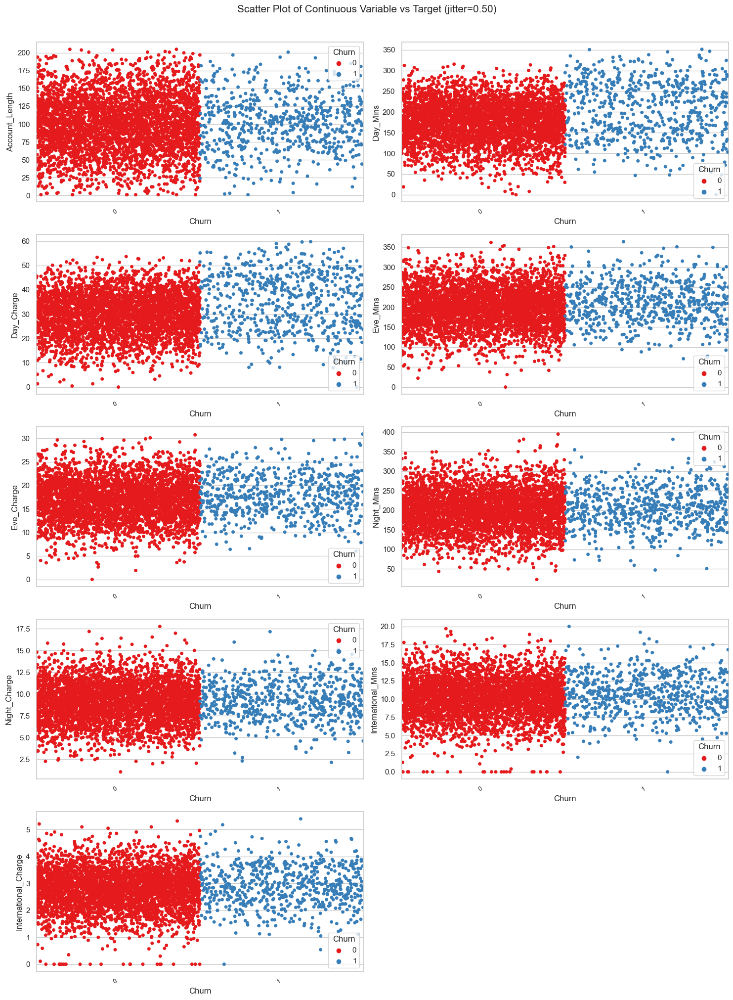

Total Number of Scatter Plots = 45


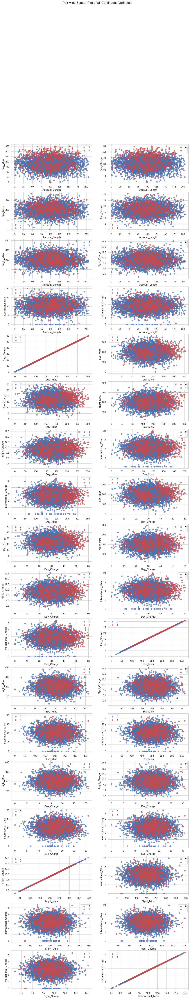

Could not draw some Distribution Plots


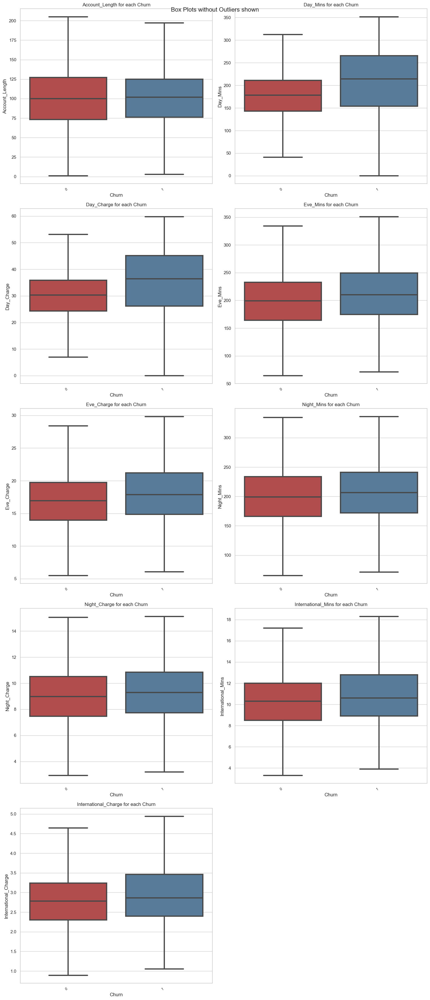

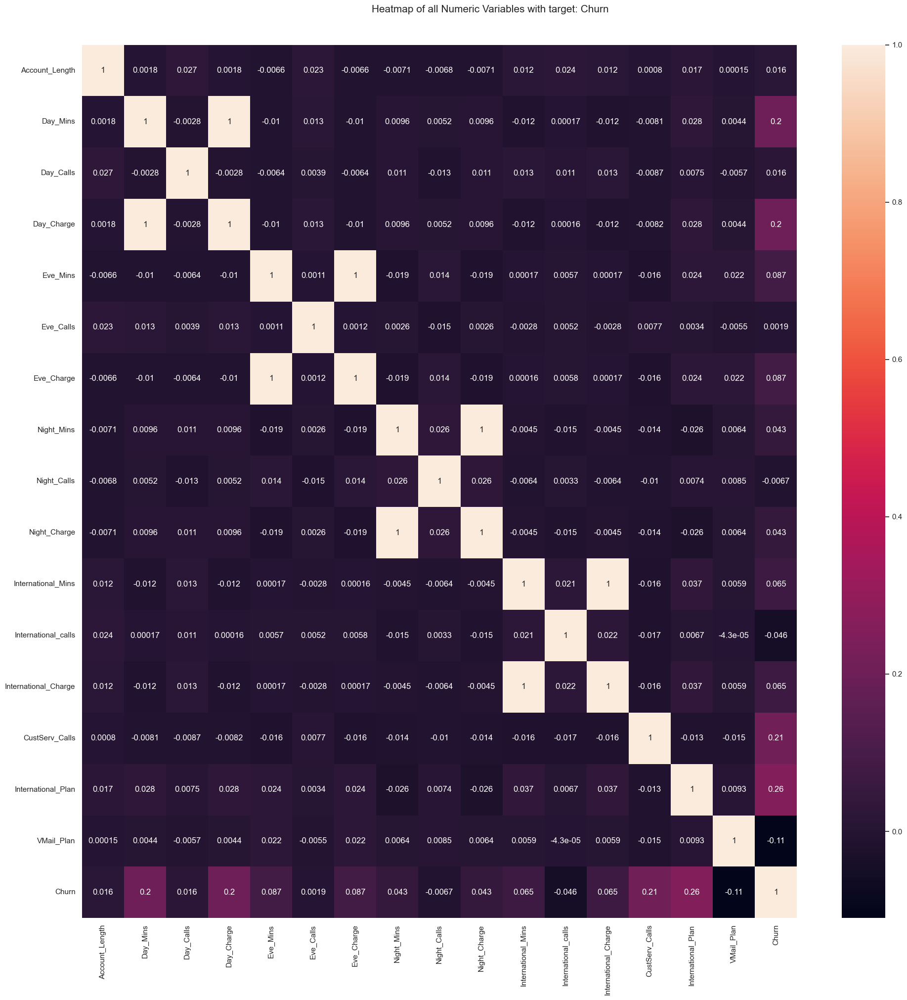

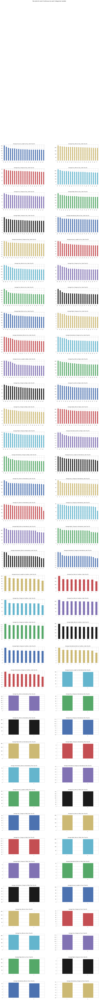

All Plots done
Time to run AutoViz = 48 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [60]:
from autoviz.AutoViz_Class import AutoViz_Class

# AutoViz visualization with all available charts
AV = AutoViz_Class()
report = AV.AutoViz(
    filename='',
    dfte=data,
    max_cols_analyzed=30,
    depVar='Churn'  # Specify the target variable if needed
)


# **DATA PREPROCESSING**

### HANDLING NULL VALUES

In [83]:
data.isnull().sum()

Account_Length          0
International_Plan      0
VMail_Plan              0
Day_Mins                0
Day_Calls               0
Day_Charge              0
Eve_Mins                0
Eve_Calls               0
Eve_Charge              0
Night_Mins              0
Night_Calls             0
Night_Charge            0
International_Mins      0
International_calls     0
International_Charge    0
CustServ_Calls          0
Churn                   0
dtype: int64

### HANDLING CATEGORICAL DATA 

In [84]:
data

,Account_Length,International_Plan,VMail_Plan,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,Churn
0,128,no,yes,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.
1,107,no,yes,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False.
2,137,no,no,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False.
3,84,yes,no,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,75,yes,no,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,57,no,yes,144.0,81,24.48,187.2,112,15.91,158.6,122,7.14,8.5,6,2.30,3,False.
4613,177,no,yes,189.0,91,32.13,303.1,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,67,no,yes,127.5,126,21.68,296.1,129,25.17,200.9,91,9.04,13.0,3,3.51,1,False.
4615,98,no,yes,168.9,98,28.71,226.3,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


In [85]:
##One Hot Encoding:-
df1=pd.get_dummies(data['International_Plan'],prefix='International_Plan',drop_first=True)
data=pd.concat([data,df1],axis=1).drop(['International_Plan'],axis=1)

In [86]:
data

,Account_Length,VMail_Plan,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,Churn,International_Plan_ yes
0,128,yes,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.,False
1,107,yes,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False.,False
2,137,no,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False.,False
3,84,no,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.,True
4,75,no,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,57,yes,144.0,81,24.48,187.2,112,15.91,158.6,122,7.14,8.5,6,2.30,3,False.,False
4613,177,yes,189.0,91,32.13,303.1,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.,False
4614,67,yes,127.5,126,21.68,296.1,129,25.17,200.9,91,9.04,13.0,3,3.51,1,False.,False
4615,98,yes,168.9,98,28.71,226.3,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.,False


In [87]:
df1=pd.get_dummies(data['VMail_Plan'],prefix='VMail_Plan',drop_first=True)
data=pd.concat([data,df1],axis=1).drop(['VMail_Plan'],axis=1)

In [88]:
data

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,Churn,International_Plan_ yes,VMail_Plan_ yes
0,128,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.,False,True
1,107,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False.,False,True
2,137,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False.,False,False
3,84,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.,True,False
4,75,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,57,144.0,81,24.48,187.2,112,15.91,158.6,122,7.14,8.5,6,2.30,3,False.,False,True
4613,177,189.0,91,32.13,303.1,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.,False,True
4614,67,127.5,126,21.68,296.1,129,25.17,200.9,91,9.04,13.0,3,3.51,1,False.,False,True
4615,98,168.9,98,28.71,226.3,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.,False,True


In [89]:
df1=pd.get_dummies(data['Churn'],prefix='Churn',drop_first=True)
data=pd.concat([data,df1],axis=1).drop(['Churn'],axis=1)

In [90]:
data

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan_ yes,VMail_Plan_ yes,Churn_ True.
0,128,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,True,False
1,107,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,True,False
2,137,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,False,False
3,84,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,True,False,False
4,75,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,57,144.0,81,24.48,187.2,112,15.91,158.6,122,7.14,8.5,6,2.30,3,False,True,False
4613,177,189.0,91,32.13,303.1,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False,True,False
4614,67,127.5,126,21.68,296.1,129,25.17,200.9,91,9.04,13.0,3,3.51,1,False,True,False
4615,98,168.9,98,28.71,226.3,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False,True,False


In [91]:
data.rename(columns={'International_Plan_ yes': 'International_Plan',
                   'VMail_Plan_ yes': 'VMail_Plan',
                   'Churn_ True.': 'Churn'}, inplace=True)

# Display the modified DataFrame
data

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
0,128,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,True,False
1,107,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,True,False
2,137,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,False,False
3,84,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,True,False,False
4,75,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,57,144.0,81,24.48,187.2,112,15.91,158.6,122,7.14,8.5,6,2.30,3,False,True,False
4613,177,189.0,91,32.13,303.1,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False,True,False
4614,67,127.5,126,21.68,296.1,129,25.17,200.9,91,9.04,13.0,3,3.51,1,False,True,False
4615,98,168.9,98,28.71,226.3,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False,True,False


**Encoded the categorical "International_Plan","VMail_Plan", "Churn"  column using one-hot encoding, effectively transforming it into binary features in the dataset**.

# **OUTLIERS HANDLING**

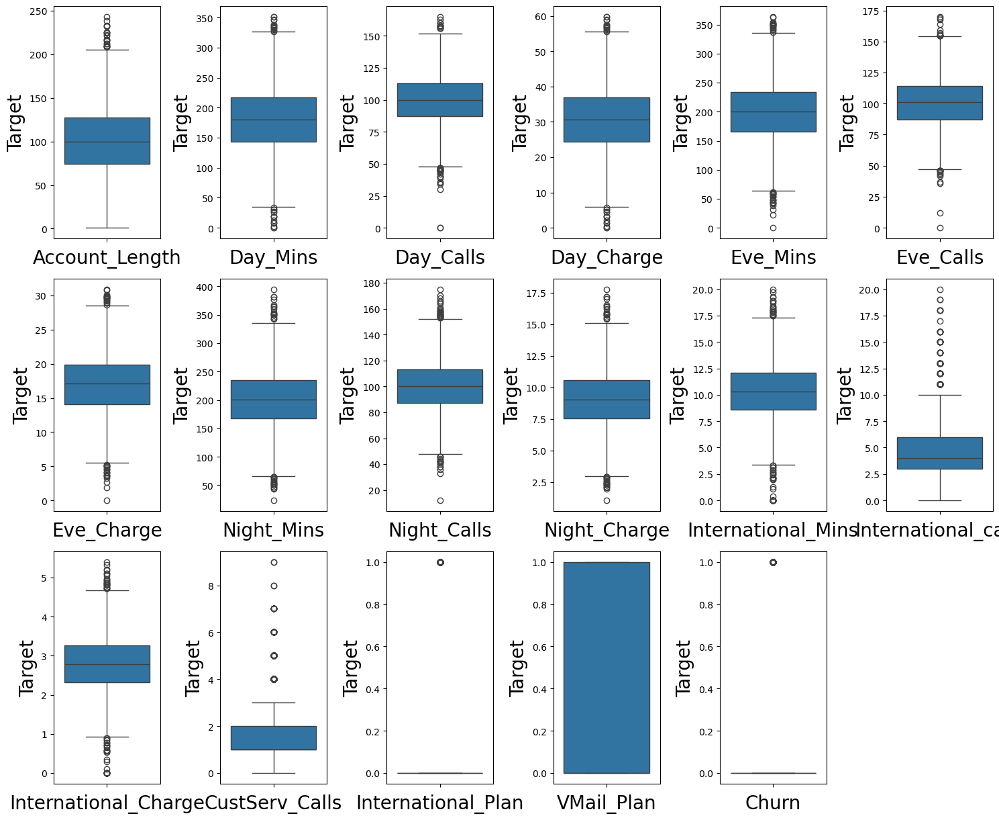

In [92]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

plt.figure(figsize=(15,20), facecolor='white')#canvas size
plotnumber = 1

for column in data:
    if plotnumber<=26 :
        ax = plt.subplot(5,6,plotnumber)
        sns.boxplot(data[column])
        plt.xlabel(column,fontsize=20)
        plt.ylabel('Target',fontsize=20)
    plotnumber+=1
plt.tight_layout()
plt.show()

Insights:-
See in the boxplot you notice that black dots present on the left and right sides of the lines, these dots are outlier than are present in a specific feature.


### Account_Length

In [93]:
## using IQR to remove the outliers
from scipy import stats
IQR = stats.iqr(data.Account_Length) 
IQR

53.0

In [94]:
## min and max limit calculation

# First quartile (Q1) 
Q1 = data.Account_Length.quantile(0.25)

# Third quartile (Q3) 
Q3 =data.Account_Length.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [95]:
min_limit

-5.5

In [96]:
max_limit

206.5

In [97]:
data.loc[data['Account_Length'] > max_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
197,208,326.5,67,55.51,176.3,113,14.99,181.7,102,8.18,10.7,6,2.89,2,False,False,True
238,215,83.6,148,14.21,120.9,91,10.28,226.6,110,10.20,10.7,9,2.89,0,False,False,False
309,209,227.2,128,38.62,258.4,92,21.96,183.5,74,8.26,8.9,4,2.40,3,False,False,False
416,224,171.5,99,29.16,160.0,103,13.60,212.4,102,9.56,5.0,2,1.35,1,True,False,True
817,243,95.5,92,16.24,163.7,63,13.91,264.2,118,11.89,6.6,6,1.78,2,False,False,False
1045,217,176.4,115,29.99,158.8,128,13.50,306.6,107,13.80,9.3,3,2.51,4,False,False,False
1093,210,104.6,121,17.78,149.5,71,12.71,255.1,67,11.48,6.5,8,1.76,2,False,False,False
1387,212,126.0,96,21.42,144.3,80,12.27,302.8,102,13.63,7.6,3,2.05,1,False,False,False
1408,232,165.6,104,28.15,195.9,115,16.65,118.3,77,5.32,11.8,3,3.19,1,False,False,False
1551,225,165.4,106,28.12,273.7,109,23.26,210.0,93,9.45,8.7,3,2.35,0,False,False,True


In [98]:
data.loc[data['Account_Length'] < min_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn


In [99]:
data.loc[data['Account_Length'] > max_limit,'Account_Length']=np.mean(data.Account_Length)

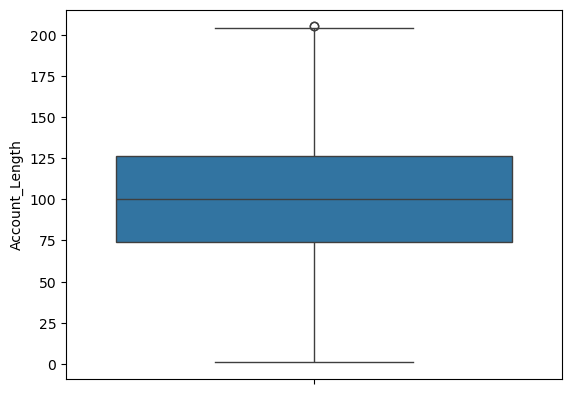

In [100]:
sns.boxplot(data["Account_Length"])
plt.show()

### Day_Mins:-

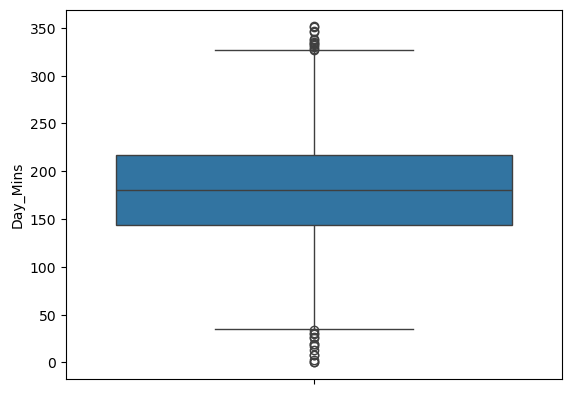

In [101]:
sns.boxplot(data["Day_Mins"])
plt.show()

In [102]:
## using IQR to remove the outliers
from scipy import stats
IQR = stats.iqr(data.Day_Mins) 
IQR

73.10000000000002

In [103]:
## min and max limit calculation

# First quartile (Q1) 
Q1 = data.Day_Mins.quantile(0.25)

# Third quartile (Q3) 
Q3 =data.Day_Mins.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [104]:
min_limit

34.049999999999955

In [105]:
max_limit

326.45000000000005

In [106]:
data.loc[data['Day_Mins'] > max_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
15,161.000000,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,False,False,True
156,83.000000,337.4,120,57.36,227.4,116,19.33,153.9,114,6.93,15.8,7,4.27,0,False,False,True
197,100.645224,326.5,67,55.51,176.3,113,14.99,181.7,102,8.18,10.7,6,2.89,2,False,False,True
365,154.000000,350.8,75,59.64,216.5,94,18.40,253.9,100,11.43,10.1,9,2.73,1,False,False,True
605,112.000000,335.5,77,57.04,212.5,109,18.06,265.0,132,11.93,12.7,8,3.43,2,False,False,True
975,129.000000,334.3,118,56.83,192.1,104,16.33,191.0,83,8.59,10.4,6,2.81,0,False,False,True
985,64.000000,346.8,55,58.96,249.5,79,21.21,275.4,102,12.39,13.3,9,3.59,1,True,False,True
1679,82.000000,329.8,73,56.07,208.3,120,17.71,267.1,102,12.02,10.6,6,2.86,0,False,False,True
2028,93.000000,328.1,106,55.78,151.7,89,12.89,303.5,114,13.66,8.7,3,2.35,1,False,False,True
2594,115.000000,345.3,81,58.70,203.4,106,17.29,217.5,107,9.79,11.8,8,3.19,1,True,False,True


In [107]:
data.loc[data['Day_Mins'] < min_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
685,63.0,30.9,113,5.25,187.0,113,15.90,230.8,101,10.39,8.6,7,2.32,1,False,True,False
741,66.0,34.0,133,5.78,278.6,61,23.68,129.6,120,5.83,11.5,3,3.11,0,False,False,False
1052,98.0,12.5,67,2.13,256.6,90,21.81,169.4,88,7.62,7.7,9,2.08,1,True,False,False
1076,53.0,25.9,119,4.40,206.5,96,17.55,228.1,64,10.26,6.5,7,1.76,1,False,True,False
1345,98.0,0.0,0,0.00,159.6,130,13.57,167.1,88,7.52,6.8,1,1.84,4,False,False,True
1397,101.0,0.0,0,0.00,192.1,119,16.33,168.8,95,7.60,7.2,4,1.94,1,False,False,False
1621,138.0,19.5,149,3.32,140.9,109,11.98,179.7,111,8.09,7.9,1,2.13,0,False,True,False
1986,70.0,7.9,100,1.34,136.4,83,11.59,156.6,89,7.05,12.1,1,3.27,0,False,False,False
2124,43.0,27.0,117,4.59,160.9,97,13.68,279.5,96,12.58,10.7,3,2.89,3,False,False,False
2252,148.0,17.6,121,2.99,161.7,125,13.74,203.1,82,9.14,10.6,6,2.86,1,False,False,False


In [108]:
data.loc[data['Day_Mins'] > max_limit,'Day_Mins']=np.mean(data.Day_Mins)

In [109]:
data.loc[data['Day_Mins'] < min_limit,'Day_Mins']=np.mean(data.Day_Mins)

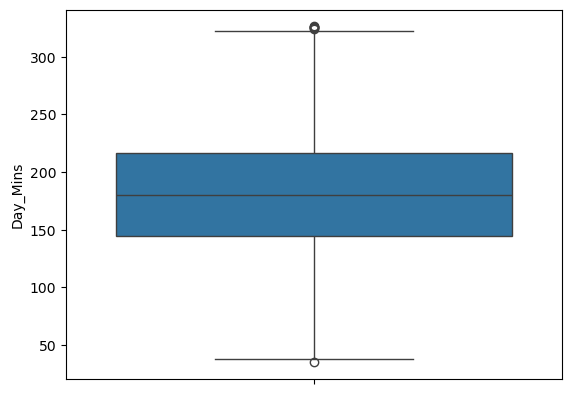

In [110]:
sns.boxplot(data["Day_Mins"])
plt.show()

### Day_Calls:-

In [111]:
## using IQR to remove the outliers
from scipy import stats
IQR = stats.iqr(data.Day_Calls) 
IQR

26.0

In [112]:
## min and max limit calculation

# First quartile (Q1) 
Q1 = data.Day_Calls.quantile(0.25)

# Third quartile (Q3) 
Q3 =data.Day_Calls.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [113]:
min_limit

48.0

In [114]:
max_limit

152.0

In [115]:
data.loc[data['Day_Calls'] > max_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
315,39.0,60.4,158,10.27,306.2,120,26.03,123.9,46,5.58,12.4,3,3.35,1,False,False,False
468,86.0,70.9,163,12.05,166.7,121,14.17,244.9,105,11.02,11.1,5,3.00,3,False,True,False
1057,86.0,123.0,158,20.91,133.9,119,11.38,138.2,103,6.22,13.3,4,3.59,1,False,True,False
1121,91.0,154.4,165,26.25,168.3,121,14.31,239.9,81,10.80,11.7,4,3.16,5,False,False,True
1460,80.0,198.1,160,33.68,156.7,87,13.32,182.1,76,8.19,9.3,3,2.51,3,False,False,False
1869,101.0,239.0,156,40.63,273.0,106,23.21,278.2,93,12.52,13.5,8,3.65,1,False,False,True
2392,90.0,125.4,158,21.32,269.1,83,22.87,238.6,103,10.74,11.0,7,2.97,1,False,False,False
2394,57.0,189.3,157,32.18,174.9,70,14.87,221.9,117,9.99,11.2,5,3.02,3,False,False,False
4230,150.0,114.8,156,19.52,135.3,78,11.50,218.4,98,9.83,15.6,4,4.21,1,True,False,True
4297,105.0,274.0,156,46.58,263.0,69,22.36,195.9,93,8.82,11.3,3,3.05,3,True,False,True


In [116]:
data.loc[data['Day_Calls'] < min_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
143,103.0,246.50000,47,41.91,195.5,84,16.62,200.5,96,9.02,11.7,4,3.16,1,False,False,False
415,113.0,239.70000,47,40.75,282.9,110,24.05,238.4,88,10.73,8.7,3,2.35,2,False,False,True
692,82.0,185.80000,36,31.59,276.5,134,23.50,192.1,104,8.64,5.7,7,1.54,4,False,False,False
740,67.0,230.60000,40,39.20,189.1,58,16.07,162.2,115,7.30,9.4,2,2.54,1,False,True,False
1144,155.0,216.70000,30,36.84,144.3,125,12.27,135.3,106,6.09,10.8,1,2.92,2,False,False,False
1322,2.0,132.10000,42,22.46,138.9,88,11.81,192.6,119,8.67,9.1,1,2.46,2,True,False,True
1345,98.0,180.00453,0,0.00,159.6,130,13.57,167.1,88,7.52,6.8,1,1.84,4,False,False,True
1346,106.0,133.70000,45,22.73,187.8,107,15.96,181.9,89,8.19,10.7,2,2.89,1,True,False,True
1397,101.0,180.00453,0,0.00,192.1,119,16.33,168.8,95,7.60,7.2,4,1.94,1,False,False,False
1422,107.0,160.30000,45,27.25,221.5,70,18.83,261.6,109,11.77,5.6,1,1.51,1,False,True,False


In [117]:
data.loc[data['Day_Calls'] > max_limit,'Day_Calls']=np.mean(data.Day_Calls)

In [118]:
data.loc[data['Day_Calls'] < min_limit,'Day_Calls']=np.mean(data.Day_Calls)

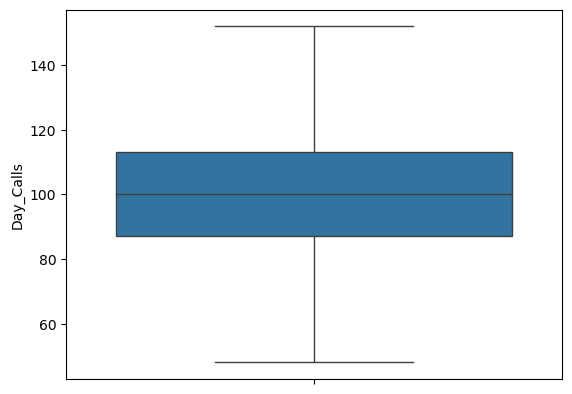

In [119]:
sns.boxplot(data["Day_Calls"])
plt.show()

### Day_Charge:-

In [120]:
## using IQR to remove the outliers
from scipy import stats
IQR = stats.iqr(data.Day_Charge) 
IQR

12.43

In [121]:
## min and max limit calculation

# First quartile (Q1) 
Q1 = data.Day_Charge.quantile(0.25)

# Third quartile (Q3) 
Q3 =data.Day_Charge.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [122]:
min_limit

5.785

In [123]:
max_limit

55.504999999999995

In [124]:
data.loc[data['Day_Charge'] > max_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
15,161.000000,180.447152,67.0,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,False,False,True
156,83.000000,180.447152,120.0,57.36,227.4,116,19.33,153.9,114,6.93,15.8,7,4.27,0,False,False,True
197,100.645224,180.447152,67.0,55.51,176.3,113,14.99,181.7,102,8.18,10.7,6,2.89,2,False,False,True
365,154.000000,180.447152,75.0,59.64,216.5,94,18.40,253.9,100,11.43,10.1,9,2.73,1,False,False,True
605,112.000000,180.447152,77.0,57.04,212.5,109,18.06,265.0,132,11.93,12.7,8,3.43,2,False,False,True
975,129.000000,180.447152,118.0,56.83,192.1,104,16.33,191.0,83,8.59,10.4,6,2.81,0,False,False,True
985,64.000000,180.447152,55.0,58.96,249.5,79,21.21,275.4,102,12.39,13.3,9,3.59,1,True,False,True
1679,82.000000,180.447152,73.0,56.07,208.3,120,17.71,267.1,102,12.02,10.6,6,2.86,0,False,False,True
2028,93.000000,180.447152,106.0,55.78,151.7,89,12.89,303.5,114,13.66,8.7,3,2.35,1,False,False,True
2594,115.000000,180.447152,81.0,58.70,203.4,106,17.29,217.5,107,9.79,11.8,8,3.19,1,True,False,True


In [125]:
data.loc[data['Day_Charge'] < min_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
685,63.0,180.00453,113.000000,5.25,187.0,113,15.90,230.8,101,10.39,8.6,7,2.32,1,False,True,False
741,66.0,180.00453,133.000000,5.78,278.6,61,23.68,129.6,120,5.83,11.5,3,3.11,0,False,False,False
1052,98.0,180.00453,67.000000,2.13,256.6,90,21.81,169.4,88,7.62,7.7,9,2.08,1,True,False,False
1076,53.0,180.00453,119.000000,4.40,206.5,96,17.55,228.1,64,10.26,6.5,7,1.76,1,False,True,False
1345,98.0,180.00453,99.902026,0.00,159.6,130,13.57,167.1,88,7.52,6.8,1,1.84,4,False,False,True
1397,101.0,180.00453,99.902026,0.00,192.1,119,16.33,168.8,95,7.60,7.2,4,1.94,1,False,False,False
1621,138.0,180.00453,149.000000,3.32,140.9,109,11.98,179.7,111,8.09,7.9,1,2.13,0,False,True,False
1986,70.0,180.00453,100.000000,1.34,136.4,83,11.59,156.6,89,7.05,12.1,1,3.27,0,False,False,False
2124,43.0,180.00453,117.000000,4.59,160.9,97,13.68,279.5,96,12.58,10.7,3,2.89,3,False,False,False
2252,148.0,180.00453,121.000000,2.99,161.7,125,13.74,203.1,82,9.14,10.6,6,2.86,1,False,False,False


In [126]:
data.loc[data['Day_Charge'] > max_limit,'Day_Charge']=np.mean(data.Day_Charge)

In [127]:
data.loc[data['Day_Charge'] < min_limit,'Day_Charge']=np.mean(data.Day_Charge)

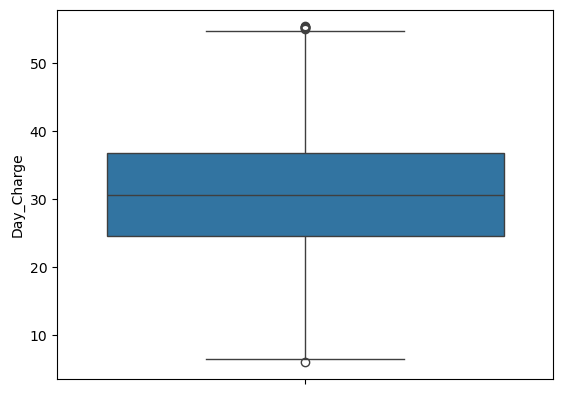

In [128]:
sns.boxplot(data["Day_Charge"])
plt.show()

### Eve_Mins:-

In [129]:
## using IQR to remove the outliers
from scipy import stats
IQR = stats.iqr(data.Eve_Mins) 
IQR

68.1

In [130]:
## min and max limit calculation

# First quartile (Q1) 
Q1 = data.Eve_Mins.quantile(0.25)

# Third quartile (Q3) 
Q3 =data.Eve_Mins.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [131]:
min_limit

63.750000000000014

In [132]:
max_limit

336.15

In [133]:
data.loc[data['Eve_Mins'] > max_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
6,121.0,218.2,88.0,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,False,True,False
8,117.0,184.5,97.0,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,False,False,False
302,121.0,170.4,108.0,28.97,350.5,68,29.79,297.0,87,13.37,11.2,3,3.02,0,False,False,True
529,100.0,68.5,110.0,11.65,337.1,115,28.65,205.2,99,9.23,12.1,9,3.27,0,True,False,False
580,113.0,209.4,151.0,35.60,347.3,113,29.52,246.0,116,11.07,7.4,2,2.00,1,False,False,True
1601,99.0,242.3,102.0,41.19,350.9,102,29.83,163.1,93,7.34,11.3,3,3.05,0,True,False,True
2160,94.0,89.5,94.0,15.22,339.9,106,28.89,172.9,76,7.78,7.9,1,2.13,1,True,False,True
2331,46.0,191.4,102.0,32.54,361.8,96,30.75,147.5,132,6.64,7.2,2,1.94,1,False,True,False
2551,102.0,129.5,56.0,22.02,354.2,118,30.11,145.5,93,6.55,10.9,3,2.94,1,False,False,False
2732,130.0,216.2,106.0,36.75,363.7,86,30.91,126.7,123,5.70,16.9,2,4.56,5,True,False,True


In [134]:
data.loc[data['Eve_Mins'] < min_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
3,84.0,299.4,71.0,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,True,False,False
32,172.0,212.0,121.0,36.04,31.2,115,2.65,293.3,78,13.20,12.6,10,3.40,3,False,False,False
533,125.0,201.3,117.0,34.22,42.2,78,3.59,125.7,104,5.66,5.4,3,1.46,1,False,True,False
587,114.0,169.6,85.0,28.83,58.9,86,5.01,179.3,124,8.07,7.4,8,2.00,1,False,False,False
821,80.0,105.8,110.0,17.99,43.9,88,3.73,189.6,87,8.53,13.1,5,3.54,0,False,False,False
850,166.0,274.3,110.0,46.63,52.9,109,4.50,246.1,119,11.07,10.9,5,2.94,0,False,False,False
889,103.0,198.5,112.0,33.75,42.5,90,3.61,179.2,124,8.06,12.4,5,3.35,0,False,False,False
893,167.0,244.8,91.0,41.62,60.8,105,5.17,176.7,110,7.95,10.7,3,2.89,2,True,False,False
1054,50.0,183.6,107.0,31.21,58.6,118,4.98,202.6,99,9.12,8.7,3,2.35,1,False,False,False
1190,149.0,156.0,56.0,26.52,56.0,116,4.76,163.3,104,7.35,8.9,8,2.40,0,False,False,False


In [135]:
data.loc[data['Eve_Mins'] > max_limit,'Eve_Mins']=np.mean(data.Eve_Mins)

In [136]:
data.loc[data['Eve_Mins'] < min_limit,'Eve_Mins']=np.mean(data.Eve_Mins)

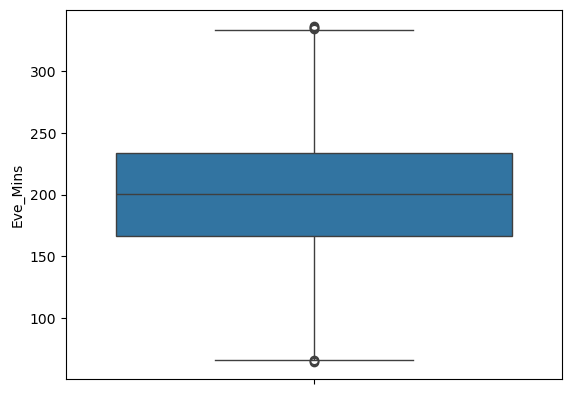

In [137]:
sns.boxplot(data["Eve_Mins"])
plt.show()

# Eve_Calls:-

In [138]:
## using IQR to remove the outliers
from scipy import stats
IQR = stats.iqr(data.Eve_Calls) 
IQR

27.0

In [139]:
## min and max limit calculation

# First quartile (Q1) 
Q1 = data.Eve_Calls.quantile(0.25)

# Third quartile (Q3) 
Q3 =data.Eve_Calls.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [140]:
min_limit

46.5

In [141]:
max_limit

154.5

In [142]:
data.loc[data['Eve_Calls'] > max_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
58,68.0,148.8,70.0,25.30,246.5,164,20.95,129.8,103,5.84,12.1,3,3.27,3,False,False,False
301,127.0,266.6,106.0,45.32,264.8,168,22.51,207.2,119,9.32,5.9,2,1.59,1,False,False,True
1020,115.0,145.0,72.0,24.65,194.5,157,16.53,242.3,138,10.90,14.2,3,3.83,2,False,True,False
1071,134.0,205.3,122.0,34.90,240.5,155,20.44,179.1,107,8.06,5.0,9,1.35,1,False,False,False
1706,54.0,273.8,113.0,46.55,119.6,156,10.17,267.6,117,12.04,11.7,3,3.16,1,False,False,False
2227,41.0,237.8,92.0,40.43,223.5,155,19.00,217.4,90,9.78,10.2,6,2.75,2,False,False,False
3121,98.0,169.9,77.0,28.88,138.3,155,11.76,142.6,105,6.42,8.5,7,2.30,1,False,False,False
3157,127.0,143.2,60.0,24.34,179.5,159,15.26,171.8,122,7.73,6.2,4,1.67,4,True,False,True
3219,150.0,139.6,72.0,23.73,332.8,170,28.29,213.8,105,9.62,8.8,2,2.38,2,False,True,False
3940,44.0,184.8,105.0,31.42,195.0,169,16.58,130.1,121,5.85,11.6,3,3.13,1,False,True,False


In [143]:
data.loc[data['Eve_Calls'] < min_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
154,96.0,260.4,115.0,44.27,146.000000,46,12.41,269.5,87,12.13,11.5,4,3.11,5,False,False,False
475,74.0,148.5,111.0,25.25,146.500000,42,12.45,289.2,83,13.01,9.9,6,2.67,3,False,False,False
646,153.0,235.6,74.0,40.05,227.900000,37,19.37,170.3,103,7.66,15.4,9,4.16,0,False,True,False
960,5.0,199.2,106.0,33.86,187.300000,12,15.92,214.0,85,9.63,13.3,3,3.59,3,False,False,False
1266,42.0,155.4,127.0,26.42,164.100000,45,13.95,157.7,128,7.10,9.0,3,2.43,0,False,False,False
1615,74.0,157.1,95.0,26.71,213.100000,36,18.11,280.4,77,12.62,7.6,3,2.05,2,False,False,False
1730,161.0,107.5,121.0,18.28,256.400000,46,21.79,247.2,131,11.12,12.6,3,3.40,2,False,False,False
1856,86.0,171.8,106.0,29.21,301.700000,44,25.64,139.4,108,6.27,9.7,5,2.62,1,False,False,False
2592,163.0,202.9,100.0,34.49,178.600000,46,15.18,203.8,116,9.17,12.8,3,3.46,5,False,False,False
2853,105.0,147.0,112.0,24.99,197.300000,43,16.77,267.4,93,12.03,8.7,3,2.35,2,False,True,False


In [144]:
data.loc[data['Eve_Calls'] > max_limit,'Eve_Calls']=np.mean(data.Eve_Calls)

In [145]:
data.loc[data['Eve_Calls'] < min_limit,'Eve_Calls']=np.mean(data.Eve_Calls)

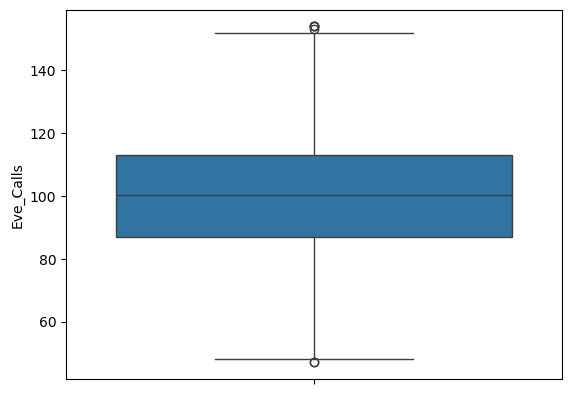

In [146]:
sns.boxplot(data["Eve_Calls"])
plt.show()

# Eve_Charge:-

In [147]:
## using IQR to remove the outliers
from scipy import stats
IQR = stats.iqr(data.Eve_Charge) 
IQR

5.790000000000001

In [148]:
## min and max limit calculation

# First quartile (Q1) 
Q1 = data.Eve_Charge.quantile(0.25)

# Third quartile (Q3) 
Q3 =data.Eve_Charge.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [149]:
min_limit

5.414999999999997

In [150]:
max_limit

28.575000000000003

In [151]:
data.loc[data['Eve_Charge'] > max_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
6,121.0,218.2,88.0,37.09,200.429088,108.0,29.62,212.6,118,9.57,7.5,7,2.03,3,False,True,False
8,117.0,184.5,97.0,31.37,200.429088,80.0,29.89,215.8,90,9.71,8.7,4,2.35,1,False,False,False
302,121.0,170.4,108.0,28.97,200.429088,68.0,29.79,297.0,87,13.37,11.2,3,3.02,0,False,False,True
529,100.0,68.5,110.0,11.65,200.429088,115.0,28.65,205.2,99,9.23,12.1,9,3.27,0,True,False,False
580,113.0,209.4,151.0,35.60,200.429088,113.0,29.52,246.0,116,11.07,7.4,2,2.00,1,False,False,True
1601,99.0,242.3,102.0,41.19,200.429088,102.0,29.83,163.1,93,7.34,11.3,3,3.05,0,True,False,True
2160,94.0,89.5,94.0,15.22,200.429088,106.0,28.89,172.9,76,7.78,7.9,1,2.13,1,True,False,True
2331,46.0,191.4,102.0,32.54,200.429088,96.0,30.75,147.5,132,6.64,7.2,2,1.94,1,False,True,False
2551,102.0,129.5,56.0,22.02,200.429088,118.0,30.11,145.5,93,6.55,10.9,3,2.94,1,False,False,False
2732,130.0,216.2,106.0,36.75,200.429088,86.0,30.91,126.7,123,5.70,16.9,2,4.56,5,True,False,True


In [152]:
data.loc[data['Eve_Charge'] < min_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
3,84.0,299.4,71.0,50.90,199.913768,88.000000,5.26,196.9,89,8.86,6.6,7,1.78,2,True,False,False
32,172.0,212.0,121.0,36.04,199.913768,115.000000,2.65,293.3,78,13.20,12.6,10,3.40,3,False,False,False
533,125.0,201.3,117.0,34.22,199.913768,78.000000,3.59,125.7,104,5.66,5.4,3,1.46,1,False,True,False
587,114.0,169.6,85.0,28.83,199.913768,86.000000,5.01,179.3,124,8.07,7.4,8,2.00,1,False,False,False
821,80.0,105.8,110.0,17.99,199.913768,88.000000,3.73,189.6,87,8.53,13.1,5,3.54,0,False,False,False
850,166.0,274.3,110.0,46.63,199.913768,109.000000,4.50,246.1,119,11.07,10.9,5,2.94,0,False,False,False
889,103.0,198.5,112.0,33.75,199.913768,90.000000,3.61,179.2,124,8.06,12.4,5,3.35,0,False,False,False
893,167.0,244.8,91.0,41.62,199.913768,105.000000,5.17,176.7,110,7.95,10.7,3,2.89,2,True,False,False
1054,50.0,183.6,107.0,31.21,199.913768,118.000000,4.98,202.6,99,9.12,8.7,3,2.35,1,False,False,False
1190,149.0,156.0,56.0,26.52,199.913768,116.000000,4.76,163.3,104,7.35,8.9,8,2.40,0,False,False,False


In [153]:
data.loc[data['Eve_Charge'] > max_limit,'Eve_Charge']=np.mean(data.Eve_Charge)

In [154]:
data.loc[data['Eve_Charge'] < min_limit,'Eve_Charge']=np.mean(data.Eve_Charge)

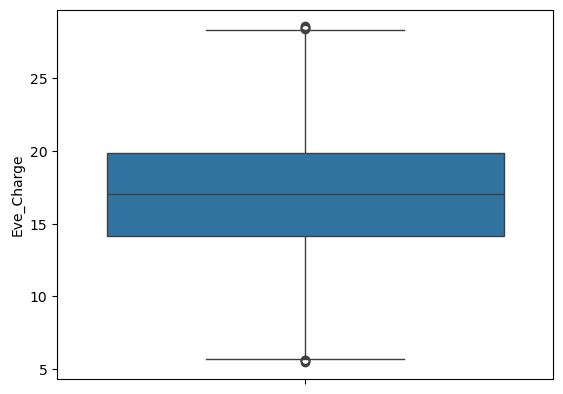

In [155]:
sns.boxplot(data["Eve_Charge"])
plt.show()


# Night_Mins:-

In [156]:
## using IQR to remove the outliers
from scipy import stats
IQR = stats.iqr(data.Night_Mins) 
IQR

67.80000000000001

In [157]:
## min and max limit calculation

# First quartile (Q1) 
Q1 = data.Night_Mins.quantile(0.25)

# Third quartile (Q3) 
Q3 =data.Night_Mins.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [158]:
min_limit

65.39999999999998

In [159]:
max_limit

336.6

In [160]:
data.loc[data['Night_Mins'] > max_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
244,108.0,198.5,99.0,33.75,267.8,60.0,22.76,354.9,75,15.97,9.4,3,2.54,0,False,False,True
444,85.0,165.4,107.0,28.12,196.0,126.0,16.66,349.2,110,15.71,9.6,7,2.59,2,True,False,False
862,75.0,163.6,132.0,27.81,146.7,113.0,12.47,345.8,115,15.56,13.1,3,3.54,3,False,True,False
918,52.0,215.9,67.0,36.70,217.0,108.0,18.45,342.8,130,15.43,5.2,2,1.40,1,False,False,False
922,80.0,239.9,121.0,40.78,142.3,51.0,12.10,364.3,106,16.39,9.3,5,2.51,1,False,False,False
1202,86.0,83.5,96.0,14.20,221.1,63.0,18.79,349.7,75,15.74,12.6,3,3.40,0,False,False,False
1238,147.0,219.9,118.0,37.38,208.5,116.0,17.72,352.5,111,15.86,8.1,4,2.19,3,True,True,False
1317,89.0,163.5,80.0,27.80,274.8,136.0,23.36,381.9,147,17.19,7.5,5,2.03,2,False,True,False
1445,55.0,222.5,104.0,37.83,171.5,94.0,14.58,377.5,114,16.99,9.7,2,2.62,1,False,True,False
2321,153.0,154.6,56.0,26.28,263.0,84.0,22.36,367.7,89,16.55,15.5,2,4.19,1,False,False,False


In [161]:
data.loc[data['Night_Mins'] < min_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
116,64.0,162.6,83.0,27.64,152.3,109.0,12.95,57.5,122,2.59,14.2,3,3.83,1,False,False,False
883,42.0,146.3,84.0,24.87,255.9,113.0,21.75,45.0,117,2.03,8.0,12,2.16,1,False,False,False
992,45.0,91.7,104.0,15.59,150.6,119.0,12.80,63.3,103,2.85,7.7,5,2.08,1,False,True,False
999,165.0,207.7,109.0,35.31,164.8,94.0,14.01,54.5,91,2.45,7.9,3,2.13,0,False,False,False
1072,164.0,219.1,88.0,37.25,151.5,99.0,12.88,50.1,60,2.25,14.3,6,3.86,1,False,True,False
1113,152.0,206.3,98.0,35.07,292.8,82.0,24.89,43.7,121,1.97,10.6,4,2.86,1,False,False,False
1260,76.0,160.1,107.0,27.22,168.7,136.0,14.34,23.2,102,1.04,9.5,4,2.57,3,False,True,False
1313,100.0,235.8,130.0,40.09,176.0,69.0,14.96,63.6,122,2.86,7.3,1,1.97,2,False,False,False
2350,176.0,169.5,151.0,28.82,112.9,84.0,9.60,56.6,99,2.55,8.7,4,2.35,0,False,False,False
2382,123.0,154.3,107.0,26.23,183.0,111.0,15.56,54.0,134,2.43,10.9,8,2.94,0,False,False,False


In [162]:
data.loc[data['Night_Mins'] > max_limit,'Night_Mins']=np.mean(data.Night_Mins)

In [163]:
data.loc[data['Night_Mins'] < min_limit,'Night_Mins']=np.mean(data.Night_Mins)

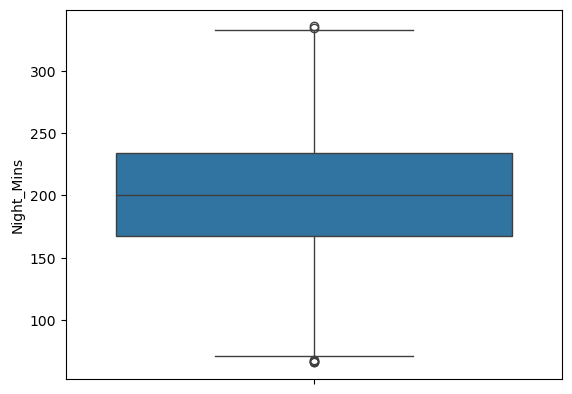

In [164]:
sns.boxplot(data["Night_Mins"])
plt.show()

# Night_Calls:-

In [165]:
## using IQR to remove the outliers
from scipy import stats
IQR = stats.iqr(data.Night_Calls) 
IQR

26.0

In [166]:
## min and max limit calculation

# First quartile (Q1) 
Q1 = data.Night_Calls.quantile(0.25)

# Third quartile (Q3) 
Q3 =data.Night_Calls.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [167]:

min_limit

48.0

In [168]:
max_limit

152.0

In [169]:
data.loc[data['Night_Calls'] > max_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
429,49.0,119.40000,69.0,20.300000,273.300000,92.0,23.230000,214.4,153,9.65,12.4,7,3.35,2,False,False,False
493,129.0,119.60000,104.0,20.330000,278.700000,88.0,23.690000,263.4,175,11.85,5.9,2,1.59,2,False,True,False
586,90.0,221.80000,97.0,37.710000,203.800000,134.0,17.320000,215.8,154,9.71,8.4,4,2.27,1,True,False,False
901,23.0,321.60000,107.0,54.670000,251.600000,115.0,21.390000,141.1,158,6.35,11.3,3,3.05,2,False,False,True
1109,118.0,140.40000,112.0,23.870000,187.100000,60.0,15.900000,207.9,155,9.36,7.9,1,2.13,0,False,False,False
1200,100.0,215.90000,90.0,36.700000,257.900000,92.0,21.920000,180.2,157,8.11,11.6,4,3.13,1,False,True,False
1296,79.0,213.60000,110.0,36.310000,234.900000,121.0,19.970000,229.6,157,10.33,8.8,3,2.38,2,False,False,False
1748,71.0,175.70000,82.0,29.870000,258.900000,136.0,22.010000,268.4,154,12.08,14.1,7,3.81,1,False,True,False
1810,124.0,194.00000,103.0,32.980000,241.000000,116.0,20.490000,227.5,153,10.24,11.9,5,3.21,0,False,False,False
2288,34.0,193.70000,74.0,32.930000,126.900000,84.0,10.790000,221.2,166,9.95,8.8,4,2.38,0,False,False,False


In [170]:
data.loc[data['Night_Calls'] < min_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
315,39.0,60.4,100.054364,10.27,306.2,120.0,26.03,123.9,46,5.58,12.4,3,3.35,1,False,False,False
326,121.0,68.7,95.000000,11.68,209.2,69.0,17.78,197.4,42,8.88,11.4,4,3.08,1,False,True,False
335,151.0,214.7,97.000000,36.50,138.5,90.0,11.77,169.1,44,7.61,8.6,4,2.32,1,False,True,False
395,98.0,278.3,89.000000,47.31,93.4,143.0,7.94,107.6,42,4.84,9.7,5,2.62,0,False,True,False
2659,15.0,121.1,130.000000,20.59,216.0,86.0,18.36,235.1,33,10.58,16.1,5,4.35,2,False,False,False
2903,97.0,183.4,94.000000,31.18,269.1,120.0,22.87,203.5,38,9.16,6.7,4,1.81,5,False,True,False
2988,105.0,259.3,96.000000,44.08,175.2,97.0,14.89,222.4,36,10.01,12.0,5,3.24,3,False,False,False
3535,83.0,129.8,87.000000,22.07,183.4,110.0,15.59,169.4,40,7.62,14.3,6,3.86,1,False,True,False
4079,119.0,287.1,83.000000,48.81,218.4,124.0,18.56,151.5,42,6.82,11.0,4,2.97,1,False,False,True
4085,159.0,181.0,107.000000,30.77,188.4,114.0,16.01,175.8,41,7.91,9.9,4,2.67,7,False,False,False


In [171]:
data.loc[data['Night_Calls'] > max_limit,'Night_Calls']=np.mean(data.Night_Calls)

In [172]:
data.loc[data['Night_Calls'] < min_limit,'Night_Calls']=np.mean(data.Night_Calls)

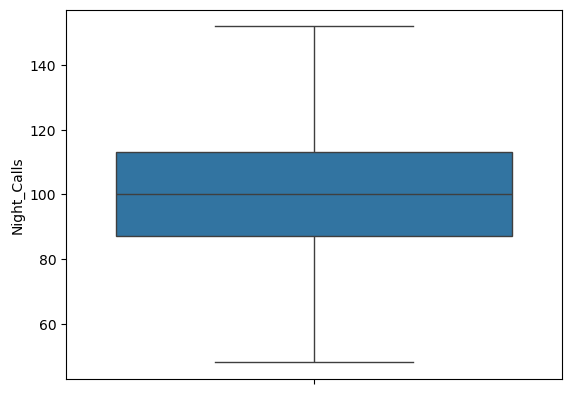

In [173]:
sns.boxplot(data["Night_Calls"])
plt.show()

# Night_Charge:-

In [174]:
## using IQR to remove the outliers
from scipy import stats
IQR = stats.iqr(data.Night_Charge) 
IQR

3.0500000000000007

In [175]:
## min and max limit calculation

# First quartile (Q1) 
Q1 = data.Night_Charge.quantile(0.25)

# Third quartile (Q3) 
Q3 =data.Night_Charge.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [176]:
min_limit

2.9449999999999985

In [177]:
max_limit

15.145000000000001

In [178]:
data.loc[data['Night_Charge'] > max_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
244,108.0,198.5,99.0,33.75,267.8,60.0,22.76,200.623933,75.0,15.97,9.4,3,2.54,0,False,False,True
444,85.0,165.4,107.0,28.12,196.0,126.0,16.66,200.623933,110.0,15.71,9.6,7,2.59,2,True,False,False
862,75.0,163.6,132.0,27.81,146.7,113.0,12.47,200.623933,115.0,15.56,13.1,3,3.54,3,False,True,False
918,52.0,215.9,67.0,36.70,217.0,108.0,18.45,200.623933,130.0,15.43,5.2,2,1.40,1,False,False,False
922,80.0,239.9,121.0,40.78,142.3,51.0,12.10,200.623933,106.0,16.39,9.3,5,2.51,1,False,False,False
1202,86.0,83.5,96.0,14.20,221.1,63.0,18.79,200.623933,75.0,15.74,12.6,3,3.40,0,False,False,False
1238,147.0,219.9,118.0,37.38,208.5,116.0,17.72,200.623933,111.0,15.86,8.1,4,2.19,3,True,True,False
1317,89.0,163.5,80.0,27.80,274.8,136.0,23.36,200.623933,147.0,17.19,7.5,5,2.03,2,False,True,False
1445,55.0,222.5,104.0,37.83,171.5,94.0,14.58,200.623933,114.0,16.99,9.7,2,2.62,1,False,True,False
2321,153.0,154.6,56.0,26.28,263.0,84.0,22.36,200.623933,89.0,16.55,15.5,2,4.19,1,False,False,False


In [179]:
data.loc[data['Night_Charge'] < min_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
116,64.0,162.6,83.0,27.64,152.3,109.0,12.95,200.033985,122.0,2.59,14.2,3,3.83,1,False,False,False
883,42.0,146.3,84.0,24.87,255.9,113.0,21.75,200.033985,117.0,2.03,8.0,12,2.16,1,False,False,False
992,45.0,91.7,104.0,15.59,150.6,119.0,12.80,200.033985,103.0,2.85,7.7,5,2.08,1,False,True,False
999,165.0,207.7,109.0,35.31,164.8,94.0,14.01,200.033985,91.0,2.45,7.9,3,2.13,0,False,False,False
1072,164.0,219.1,88.0,37.25,151.5,99.0,12.88,200.033985,60.0,2.25,14.3,6,3.86,1,False,True,False
1113,152.0,206.3,98.0,35.07,292.8,82.0,24.89,200.033985,121.0,1.97,10.6,4,2.86,1,False,False,False
1260,76.0,160.1,107.0,27.22,168.7,136.0,14.34,200.033985,102.0,1.04,9.5,4,2.57,3,False,True,False
1313,100.0,235.8,130.0,40.09,176.0,69.0,14.96,200.033985,122.0,2.86,7.3,1,1.97,2,False,False,False
2350,176.0,169.5,151.0,28.82,112.9,84.0,9.60,200.033985,99.0,2.55,8.7,4,2.35,0,False,False,False
2382,123.0,154.3,107.0,26.23,183.0,111.0,15.56,200.033985,134.0,2.43,10.9,8,2.94,0,False,False,False


In [180]:
data.loc[data['Night_Charge'] > max_limit,'Night_Charge']=np.mean(data.Night_Charge)

In [181]:
data.loc[data['Night_Charge'] < min_limit,'Night_Charge']=np.mean(data.Night_Charge)

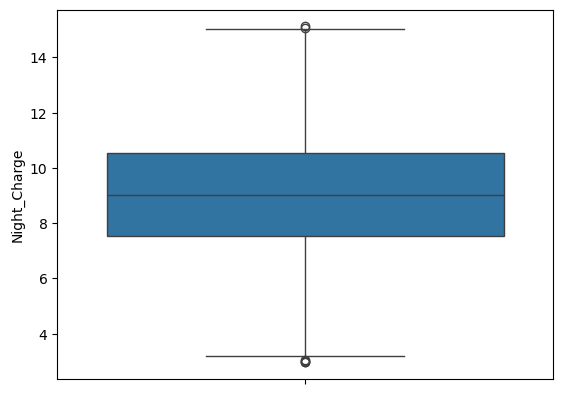

In [182]:
sns.boxplot(data["Night_Charge"])
plt.show()

# International_Mins:-

In [183]:
## using IQR to remove the outliers
from scipy import stats
IQR = stats.iqr(data.International_Mins) 
IQR

3.5

In [184]:
## min and max limit calculation

# First quartile (Q1) 
Q1 = data.International_Mins.quantile(0.25)

# Third quartile (Q3) 
Q3 =data.International_Mins.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [185]:
min_limit

3.3499999999999996

In [186]:
max_limit

17.35

In [187]:
data.loc[data['International_Mins'] > max_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
115,36.0,196.8,89.0,33.46,254.9,122.0,21.67,138.3,126.0,6.22,20.0,6,5.40,0,True,True,True
214,70.0,226.7,98.0,38.54,228.1,115.0,19.39,73.2,93.0,3.29,17.6,4,4.75,2,True,False,True
314,128.0,125.2,99.0,21.28,205.4,107.0,17.46,254.4,111.0,11.45,18.9,2,5.10,0,False,False,False
367,45.0,78.2,127.0,13.29,253.4,108.0,21.54,255.0,100.0,11.48,18.0,3,4.86,1,False,False,False
502,93.0,216.9,61.0,36.87,207.4,120.0,17.63,221.7,110.0,9.98,17.5,5,4.73,1,True,False,True
515,148.0,93.6,137.0,15.91,193.8,72.0,16.47,144.9,84.0,6.52,17.5,5,4.73,1,False,True,False
535,194.0,48.4,101.0,8.23,281.1,138.0,23.89,218.5,87.0,9.83,18.2,1,4.91,1,False,False,False
1257,73.0,182.3,115.0,30.99,199.2,97.0,16.93,120.2,113.0,5.41,18.0,5,4.86,1,False,False,False
1420,81.0,149.4,68.0,25.40,171.9,98.0,14.61,214.5,97.0,9.65,17.9,3,4.83,3,True,False,True
1816,53.0,184.8,98.0,31.42,216.4,125.0,18.39,141.1,116.0,6.35,18.4,3,4.97,2,False,False,False


In [188]:
data.loc[data['International_Mins'] < min_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
179,70.000000,232.1,122.0,39.46,292.3,112.0,24.85,201.2,112.00000,9.05,0.0,0,0.00,3,False,False,False
225,65.000000,213.4,111.0,36.28,234.5,94.0,19.93,250.1,123.00000,11.25,2.7,4,0.73,1,False,False,False
343,98.000000,64.6,98.0,10.98,176.1,86.0,14.97,244.8,84.00000,11.02,0.0,0,0.00,2,False,True,False
397,94.000000,234.4,103.0,39.85,279.3,109.0,23.74,234.2,121.00000,10.54,2.0,2,0.54,1,False,False,True
488,165.000000,242.9,126.0,41.29,209.8,65.0,17.83,228.4,126.00000,10.28,0.0,0,0.00,1,False,False,False
595,87.000000,151.4,95.0,25.74,152.4,97.0,12.95,250.1,109.00000,11.25,0.0,0,0.00,1,False,True,False
712,106.000000,114.4,104.0,19.45,78.3,101.0,6.66,232.7,78.00000,10.47,0.0,0,0.00,2,False,False,False
762,161.000000,189.6,78.0,32.23,267.4,117.0,22.73,184.5,137.00000,8.30,1.3,6,0.35,1,True,False,False
878,62.000000,281.0,66.0,47.77,160.6,108.0,13.65,77.9,74.00000,3.51,0.0,0,0.00,1,False,False,False
1028,70.000000,222.8,114.0,37.88,215.9,113.0,18.35,223.5,122.00000,10.06,0.0,0,0.00,1,False,False,False


In [189]:
data.loc[data['International_Mins'] > max_limit,'International_Mins']=np.mean(data.International_Mins)

In [190]:
data.loc[data['International_Mins'] < min_limit,'International_Mins']=np.mean(data.International_Mins)

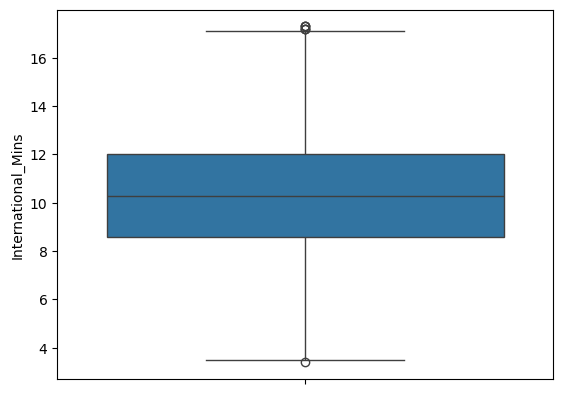

In [191]:
sns.boxplot(data["International_Mins"])
plt.show()

# International_calls:-

In [192]:
## using IQR to remove the outliers
from scipy import stats
IQR = stats.iqr(data.International_calls) 
IQR

3.0

In [193]:
## min and max limit calculation

# First quartile (Q1) 
Q1 = data.International_calls.quantile(0.25)

# Third quartile (Q3) 
Q3 =data.International_calls.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [194]:
min_limit

-1.5

In [195]:
max_limit

10.5

In [196]:
data.loc[data['International_calls'] > max_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
22,130.0,183.0,112.0,31.11,72.9,99.0,6.20,181.8,78.000000,8.18,9.5,19,2.57,0,False,False,False
41,135.0,173.1,85.0,29.43,203.9,107.0,17.33,122.2,78.000000,5.50,14.6,15,3.94,0,True,True,True
153,56.0,226.0,112.0,38.42,248.5,118.0,21.12,140.5,142.000000,6.32,6.9,11,1.86,1,False,False,False
182,67.0,115.6,111.0,19.65,237.7,94.0,20.20,169.9,103.000000,7.65,9.9,12,2.67,2,False,True,False
185,73.0,214.3,145.0,36.43,268.5,135.0,22.82,241.2,92.000000,10.85,10.8,13,2.92,1,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4386,88.0,132.9,132.0,22.59,208.2,82.0,17.70,260.5,99.612421,11.72,14.4,11,3.89,2,True,False,True
4408,65.0,189.3,74.0,32.18,205.3,90.0,17.45,228.2,78.000000,10.27,8.5,13,2.30,3,False,False,False
4465,116.0,254.6,107.0,43.28,249.4,89.0,21.20,229.6,77.000000,10.33,9.0,18,2.43,2,False,False,True
4478,109.0,155.9,110.0,26.50,161.2,99.0,13.70,229.2,81.000000,10.31,11.5,13,3.11,0,False,True,False


In [197]:
data.loc[data['International_calls'] < min_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn


In [198]:
data.loc[data['International_calls'] > max_limit,'International_calls']=np.median(data.International_calls)

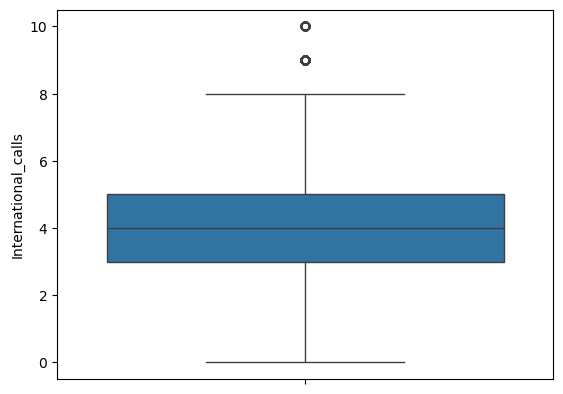

In [199]:
sns.boxplot(data["International_calls"])
plt.show()

# International_Charge:-

In [200]:
## using IQR to remove the outliers
from scipy import stats
IQR = stats.iqr(data.International_Charge) 
IQR

0.9500000000000002

In [201]:
## min and max limit calculation

# First quartile (Q1) 
Q1 = data.International_Charge.quantile(0.25)

# Third quartile (Q3) 
Q3 =data.International_Charge.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [202]:
min_limit

0.8949999999999996

In [203]:
max_limit

4.695

In [204]:
data.loc[data['International_Charge'] > max_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
115,36.0,196.8,89.0,33.46,254.9,122.0,21.67,138.3,126.0,6.22,10.279294,6,5.40,0,True,True,True
214,70.0,226.7,98.0,38.54,228.1,115.0,19.39,73.2,93.0,3.29,10.279294,4,4.75,2,True,False,True
314,128.0,125.2,99.0,21.28,205.4,107.0,17.46,254.4,111.0,11.45,10.279294,2,5.10,0,False,False,False
367,45.0,78.2,127.0,13.29,253.4,108.0,21.54,255.0,100.0,11.48,10.279294,3,4.86,1,False,False,False
502,93.0,216.9,61.0,36.87,207.4,120.0,17.63,221.7,110.0,9.98,10.279294,5,4.73,1,True,False,True
515,148.0,93.6,137.0,15.91,193.8,72.0,16.47,144.9,84.0,6.52,10.279294,5,4.73,1,False,True,False
535,194.0,48.4,101.0,8.23,281.1,138.0,23.89,218.5,87.0,9.83,10.279294,1,4.91,1,False,False,False
1257,73.0,182.3,115.0,30.99,199.2,97.0,16.93,120.2,113.0,5.41,10.279294,5,4.86,1,False,False,False
1420,81.0,149.4,68.0,25.40,171.9,98.0,14.61,214.5,97.0,9.65,10.279294,3,4.83,3,True,False,True
1816,53.0,184.8,98.0,31.42,216.4,125.0,18.39,141.1,116.0,6.35,10.279294,3,4.97,2,False,False,False


In [205]:
data.loc[data['International_Charge'] < min_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
179,70.000000,232.1,122.0,39.46,292.3,112.0,24.85,201.2,112.00000,9.05,10.23936,0,0.00,3,False,False,False
225,65.000000,213.4,111.0,36.28,234.5,94.0,19.93,250.1,123.00000,11.25,10.23936,4,0.73,1,False,False,False
343,98.000000,64.6,98.0,10.98,176.1,86.0,14.97,244.8,84.00000,11.02,10.23936,0,0.00,2,False,True,False
397,94.000000,234.4,103.0,39.85,279.3,109.0,23.74,234.2,121.00000,10.54,10.23936,2,0.54,1,False,False,True
488,165.000000,242.9,126.0,41.29,209.8,65.0,17.83,228.4,126.00000,10.28,10.23936,0,0.00,1,False,False,False
595,87.000000,151.4,95.0,25.74,152.4,97.0,12.95,250.1,109.00000,11.25,10.23936,0,0.00,1,False,True,False
712,106.000000,114.4,104.0,19.45,78.3,101.0,6.66,232.7,78.00000,10.47,10.23936,0,0.00,2,False,False,False
762,161.000000,189.6,78.0,32.23,267.4,117.0,22.73,184.5,137.00000,8.30,10.23936,6,0.35,1,True,False,False
878,62.000000,281.0,66.0,47.77,160.6,108.0,13.65,77.9,74.00000,3.51,10.23936,0,0.00,1,False,False,False
1028,70.000000,222.8,114.0,37.88,215.9,113.0,18.35,223.5,122.00000,10.06,10.23936,0,0.00,1,False,False,False


In [206]:
data.loc[data['International_Charge'] > max_limit,'International_Charge']=np.mean(data.International_Charge)

In [207]:
data.loc[data['International_Charge'] < min_limit,'International_Charge']=np.mean(data.International_Charge)

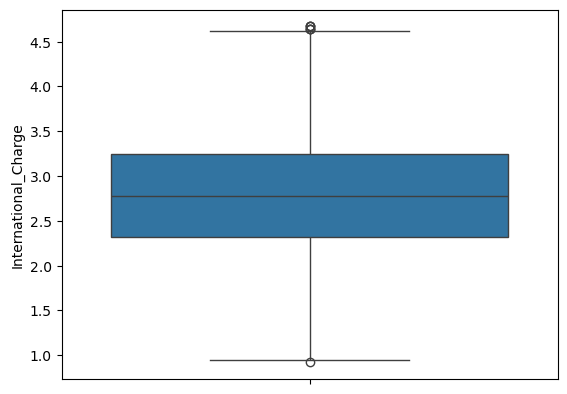

In [208]:
sns.boxplot(data["International_Charge"])
plt.show()

# CustServ_Calls:-

In [209]:
## using IQR to remove the outliers
from scipy import stats
IQR = stats.iqr(data.CustServ_Calls) 
IQR

1.0

In [210]:
## min and max limit calculation

# First quartile (Q1) 
Q1 = data.CustServ_Calls.quantile(0.25)

# Third quartile (Q3) 
Q3 =data.CustServ_Calls.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR

max_limit=Q3 +1.5*IQR

In [211]:
min_limit

-0.5

In [212]:
max_limit

3.5

In [213]:
data.loc[data['CustServ_Calls'] > max_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
10,65.0,129.100000,137.000000,21.950000,228.5,83.0,19.42,208.8,111.00000,9.40,12.7,6,3.43,4,False,False,True
14,62.0,120.700000,70.000000,20.520000,307.2,76.0,26.11,203.0,99.00000,9.14,13.1,6,3.54,4,False,False,False
15,161.0,180.447152,67.000000,30.676576,317.8,97.0,27.01,160.6,128.00000,7.23,5.4,9,1.46,4,False,False,True
21,77.0,62.400000,89.000000,10.610000,169.9,121.0,14.44,209.6,64.00000,9.43,5.7,6,1.54,5,False,False,True
48,119.0,159.100000,114.000000,27.050000,231.3,117.0,19.66,143.2,91.00000,6.44,8.8,3,2.38,5,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4538,107.0,228.200000,90.000000,38.790000,214.2,123.0,18.21,183.1,79.00000,8.24,10.5,4,2.84,4,False,False,False
4550,69.0,211.700000,94.000000,35.990000,236.1,124.0,20.07,252.7,90.00000,11.37,7.2,2,1.94,4,False,False,False
4562,42.0,137.900000,100.054364,23.440000,234.9,107.0,19.97,166.6,70.00000,7.50,14.3,3,3.86,5,False,False,True
4568,124.0,108.200000,92.000000,18.390000,214.3,83.0,18.22,185.5,99.94412,8.35,13.2,4,3.56,4,False,False,True


In [214]:
data.loc[data['CustServ_Calls'] < min_limit]

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn


In [215]:
data.loc[data['CustServ_Calls'] > max_limit,'CustServ_Calls']=np.median(data.CustServ_Calls)

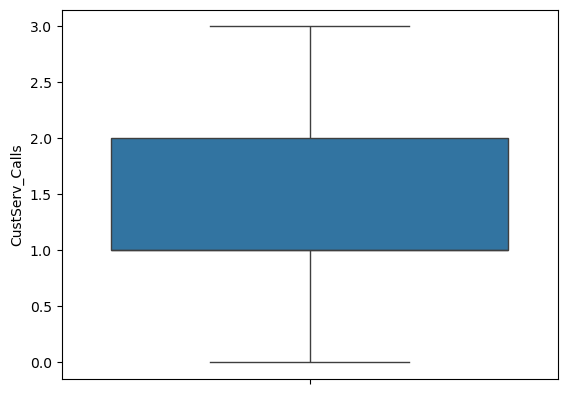

In [216]:
sns.boxplot(data["CustServ_Calls"])
plt.show()

# **SCALING THE DATA**

In [217]:
data

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,International_Plan,VMail_Plan,Churn
0,128.0,265.1,110.0,45.07,197.400000,99.0,16.780000,244.7,91.0,11.01,10.0,3,2.70,1,False,True,False
1,107.0,161.6,123.0,27.47,195.500000,103.0,16.620000,254.4,103.0,11.45,13.7,3,3.70,1,False,True,False
2,137.0,243.4,114.0,41.38,121.200000,110.0,10.300000,162.6,104.0,7.32,12.2,5,3.29,0,False,False,False
3,84.0,299.4,71.0,50.90,199.913768,88.0,16.992902,196.9,89.0,8.86,6.6,7,1.78,2,True,False,False
4,75.0,166.7,113.0,28.34,148.300000,122.0,12.610000,186.9,121.0,8.41,10.1,3,2.73,3,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,57.0,144.0,81.0,24.48,187.200000,112.0,15.910000,158.6,122.0,7.14,8.5,6,2.30,3,False,True,False
4613,177.0,189.0,91.0,32.13,303.100000,96.0,25.760000,163.6,116.0,7.36,15.7,1,4.24,3,False,True,False
4614,67.0,127.5,126.0,21.68,296.100000,129.0,25.170000,200.9,91.0,9.04,13.0,3,3.51,1,False,True,False
4615,98.0,168.9,98.0,28.71,226.300000,117.0,19.240000,165.5,96.0,7.45,14.3,3,3.86,0,False,True,False


In [218]:
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()
df = data[['Account_Length','Day_Mins','Day_Calls','Day_Charge','Eve_Mins','Eve_Calls','Eve_Charge','Night_Mins','Night_Calls','Night_Charge','International_Mins','International_calls','International_Charge','CustServ_Calls']]
scaled_data = sc.fit_transform(df)
scaled_data

array([[0.62254902, 0.78983516, 0.59615385, ..., 0.3       , 0.47466667,
        0.33333333],
       [0.51960784, 0.43440934, 0.72115385, ..., 0.3       , 0.74133333,
        0.33333333],
       [0.66666667, 0.71531593, 0.63461538, ..., 0.5       , 0.632     ,
        0.        ],
       ...,
       [0.32352941, 0.31730769, 0.75      , ..., 0.3       , 0.69066667,
        0.33333333],
       [0.4754902 , 0.45947802, 0.48076923, ..., 0.3       , 0.784     ,
        0.        ],
       [0.68137255, 0.58241758, 0.5       , ..., 0.4       , 0.62666667,
        0.66666667]])

In [219]:
df2 = pd.DataFrame(scaled_data, columns=['Account_Length','Day_Mins','Day_Calls','Day_Charge','Eve_Mins','Eve_Calls','Eve_Charge','Night_Mins','Night_Calls','Night_Charge','International_Mins','International_calls','International_Charge','CustServ_Calls'])
df2

,Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls
0,0.622549,0.789835,0.596154,0.789899,0.489879,0.485981,0.489822,0.661982,0.413462,0.662007,0.474820,0.3,0.474667,0.333333
1,0.519608,0.434409,0.721154,0.434343,0.482886,0.523364,0.482893,0.697855,0.528846,0.698191,0.741007,0.3,0.741333,0.333333
2,0.666667,0.715316,0.634615,0.715354,0.209422,0.588785,0.209181,0.358358,0.538462,0.358553,0.633094,0.5,0.632000,0.000000
3,0.406863,0.907624,0.221154,0.907677,0.499131,0.383178,0.499043,0.485207,0.394231,0.485197,0.230216,0.7,0.229333,0.666667
4,0.362745,0.451923,0.625000,0.451919,0.309165,0.700935,0.309225,0.448225,0.701923,0.448191,0.482014,0.3,0.482667,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,0.274510,0.373970,0.317308,0.373939,0.452337,0.607477,0.452144,0.343565,0.711538,0.343750,0.366906,0.6,0.368000,1.000000
4613,0.862745,0.528503,0.413462,0.528485,0.878911,0.457944,0.878735,0.362056,0.653846,0.361842,0.884892,0.1,0.885333,1.000000
4614,0.323529,0.317308,0.750000,0.317374,0.853147,0.766355,0.853183,0.500000,0.413462,0.500000,0.690647,0.3,0.690667,0.333333
4615,0.475490,0.459478,0.480769,0.459394,0.596246,0.654206,0.596362,0.369083,0.461538,0.369243,0.784173,0.3,0.784000,0.000000


### INSIGHTS:-
* Scaled the specified columns
  (Account_Length,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls) excluding International_Plan,VMail_Plan,Churn

# **FEATURES SELECTION** 

##  **CHECKING THE CORRELATION**

<Axes: >

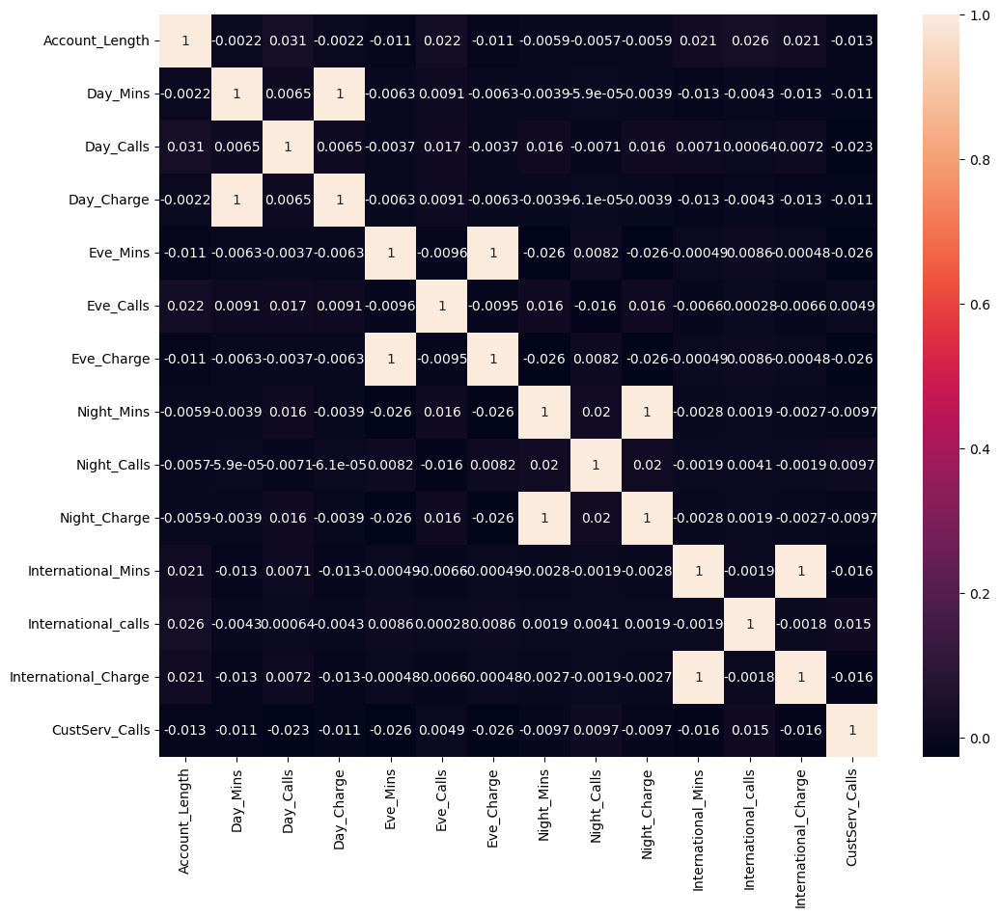

In [220]:
plt.figure(figsize=(12,10))
sns.heatmap(df2.corr(),annot=True)

In [221]:
df2.drop('Day_Charge', axis=1,inplace=True)

In [222]:
df2

,Account_Length,Day_Mins,Day_Calls,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls
0,0.622549,0.789835,0.596154,0.489879,0.485981,0.489822,0.661982,0.413462,0.662007,0.474820,0.3,0.474667,0.333333
1,0.519608,0.434409,0.721154,0.482886,0.523364,0.482893,0.697855,0.528846,0.698191,0.741007,0.3,0.741333,0.333333
2,0.666667,0.715316,0.634615,0.209422,0.588785,0.209181,0.358358,0.538462,0.358553,0.633094,0.5,0.632000,0.000000
3,0.406863,0.907624,0.221154,0.499131,0.383178,0.499043,0.485207,0.394231,0.485197,0.230216,0.7,0.229333,0.666667
4,0.362745,0.451923,0.625000,0.309165,0.700935,0.309225,0.448225,0.701923,0.448191,0.482014,0.3,0.482667,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,0.274510,0.373970,0.317308,0.452337,0.607477,0.452144,0.343565,0.711538,0.343750,0.366906,0.6,0.368000,1.000000
4613,0.862745,0.528503,0.413462,0.878911,0.457944,0.878735,0.362056,0.653846,0.361842,0.884892,0.1,0.885333,1.000000
4614,0.323529,0.317308,0.750000,0.853147,0.766355,0.853183,0.500000,0.413462,0.500000,0.690647,0.3,0.690667,0.333333
4615,0.475490,0.459478,0.480769,0.596246,0.654206,0.596362,0.369083,0.461538,0.369243,0.784173,0.3,0.784000,0.000000


<Axes: >

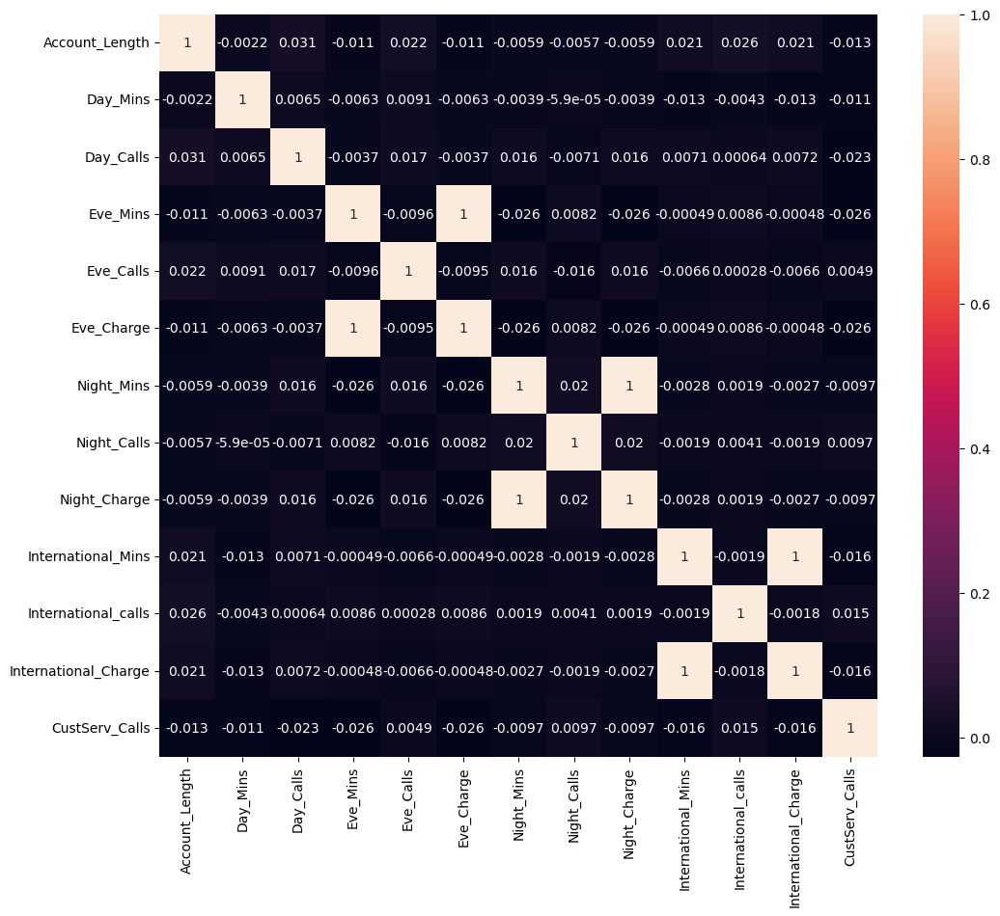

In [223]:
plt.figure(figsize=(12,10))
sns.heatmap(df2.corr(),annot=True)

In [224]:
df2.drop('Eve_Charge', axis=1,inplace=True)

In [225]:
df2

,Account_Length,Day_Mins,Day_Calls,Eve_Mins,Eve_Calls,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls
0,0.622549,0.789835,0.596154,0.489879,0.485981,0.661982,0.413462,0.662007,0.474820,0.3,0.474667,0.333333
1,0.519608,0.434409,0.721154,0.482886,0.523364,0.697855,0.528846,0.698191,0.741007,0.3,0.741333,0.333333
2,0.666667,0.715316,0.634615,0.209422,0.588785,0.358358,0.538462,0.358553,0.633094,0.5,0.632000,0.000000
3,0.406863,0.907624,0.221154,0.499131,0.383178,0.485207,0.394231,0.485197,0.230216,0.7,0.229333,0.666667
4,0.362745,0.451923,0.625000,0.309165,0.700935,0.448225,0.701923,0.448191,0.482014,0.3,0.482667,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
4612,0.274510,0.373970,0.317308,0.452337,0.607477,0.343565,0.711538,0.343750,0.366906,0.6,0.368000,1.000000
4613,0.862745,0.528503,0.413462,0.878911,0.457944,0.362056,0.653846,0.361842,0.884892,0.1,0.885333,1.000000
4614,0.323529,0.317308,0.750000,0.853147,0.766355,0.500000,0.413462,0.500000,0.690647,0.3,0.690667,0.333333
4615,0.475490,0.459478,0.480769,0.596246,0.654206,0.369083,0.461538,0.369243,0.784173,0.3,0.784000,0.000000


<Axes: >

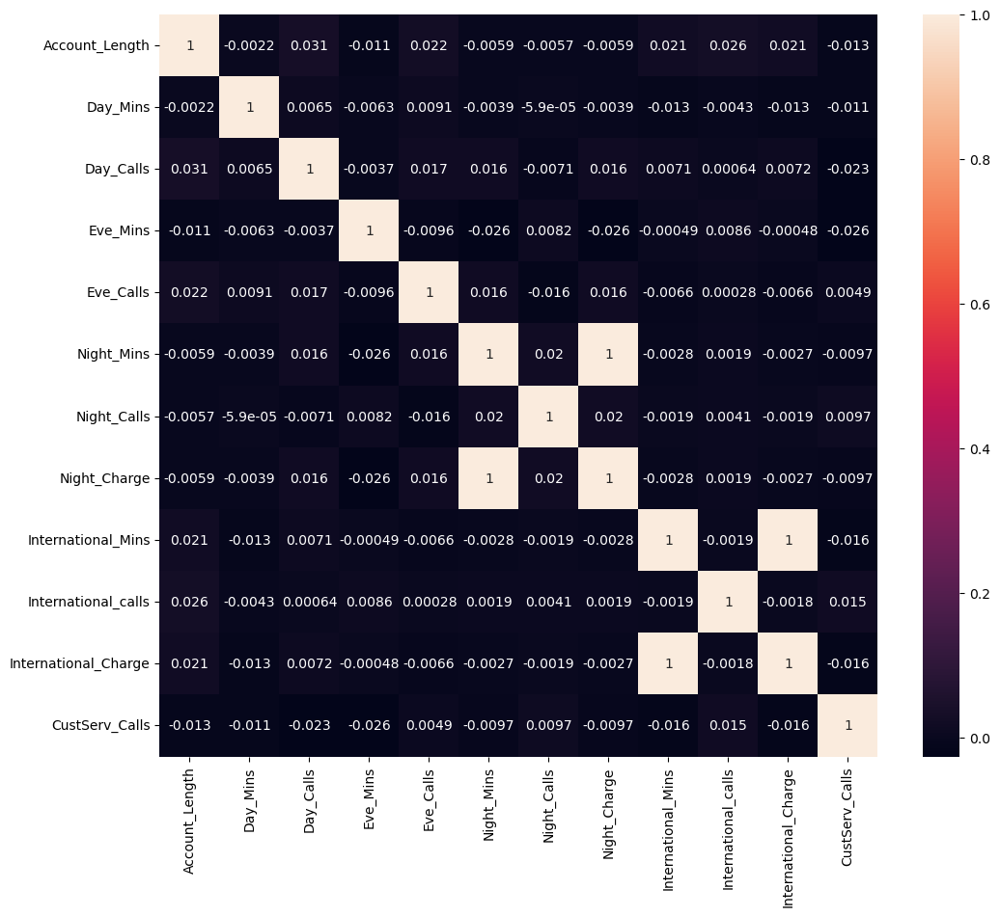

In [226]:
plt.figure(figsize=(12,10))
sns.heatmap(df2.corr(),annot=True)

In [227]:
df2.drop('Night_Charge', axis=1,inplace=True)

In [228]:
df2

,Account_Length,Day_Mins,Day_Calls,Eve_Mins,Eve_Calls,Night_Mins,Night_Calls,International_Mins,International_calls,International_Charge,CustServ_Calls
0,0.622549,0.789835,0.596154,0.489879,0.485981,0.661982,0.413462,0.474820,0.3,0.474667,0.333333
1,0.519608,0.434409,0.721154,0.482886,0.523364,0.697855,0.528846,0.741007,0.3,0.741333,0.333333
2,0.666667,0.715316,0.634615,0.209422,0.588785,0.358358,0.538462,0.633094,0.5,0.632000,0.000000
3,0.406863,0.907624,0.221154,0.499131,0.383178,0.485207,0.394231,0.230216,0.7,0.229333,0.666667
4,0.362745,0.451923,0.625000,0.309165,0.700935,0.448225,0.701923,0.482014,0.3,0.482667,1.000000
...,...,...,...,...,...,...,...,...,...,...,...
4612,0.274510,0.373970,0.317308,0.452337,0.607477,0.343565,0.711538,0.366906,0.6,0.368000,1.000000
4613,0.862745,0.528503,0.413462,0.878911,0.457944,0.362056,0.653846,0.884892,0.1,0.885333,1.000000
4614,0.323529,0.317308,0.750000,0.853147,0.766355,0.500000,0.413462,0.690647,0.3,0.690667,0.333333
4615,0.475490,0.459478,0.480769,0.596246,0.654206,0.369083,0.461538,0.784173,0.3,0.784000,0.000000


<Axes: >

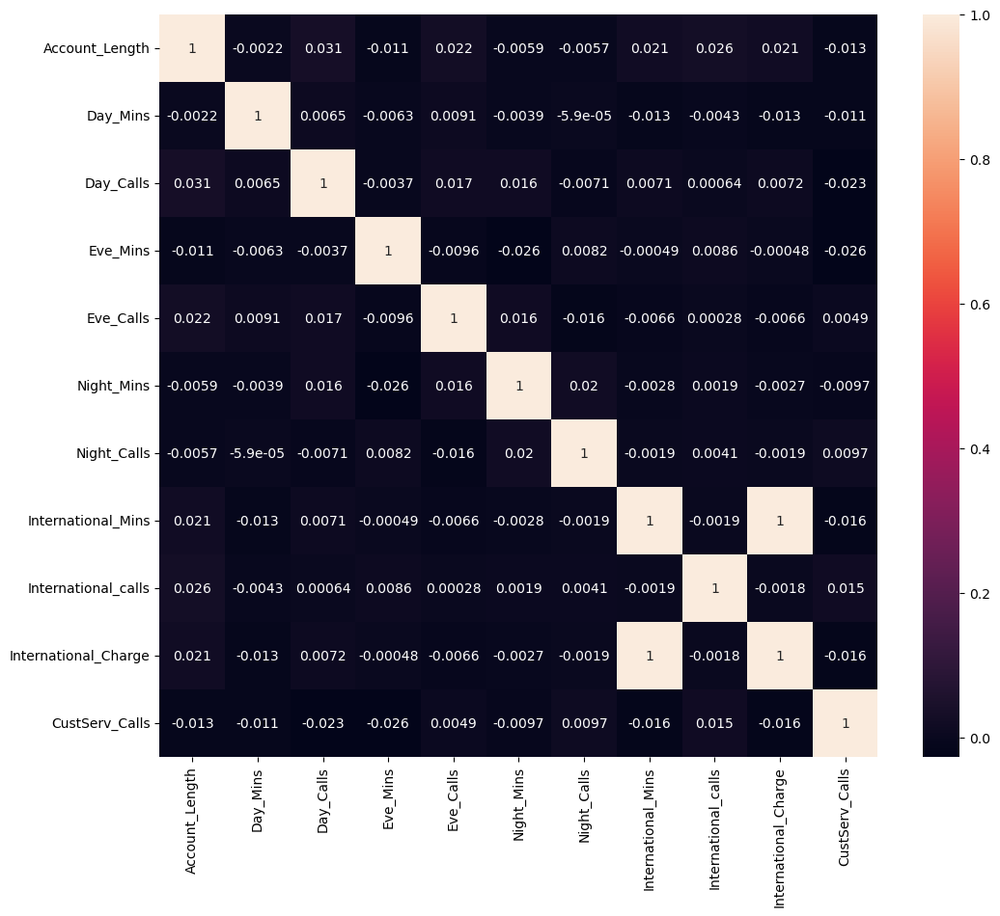

In [229]:
plt.figure(figsize=(12,10))
sns.heatmap(df2.corr(),annot=True)

In [230]:
df2.drop('International_Charge', axis=1,inplace=True)

In [231]:
df2

,Account_Length,Day_Mins,Day_Calls,Eve_Mins,Eve_Calls,Night_Mins,Night_Calls,International_Mins,International_calls,CustServ_Calls
0,0.622549,0.789835,0.596154,0.489879,0.485981,0.661982,0.413462,0.474820,0.3,0.333333
1,0.519608,0.434409,0.721154,0.482886,0.523364,0.697855,0.528846,0.741007,0.3,0.333333
2,0.666667,0.715316,0.634615,0.209422,0.588785,0.358358,0.538462,0.633094,0.5,0.000000
3,0.406863,0.907624,0.221154,0.499131,0.383178,0.485207,0.394231,0.230216,0.7,0.666667
4,0.362745,0.451923,0.625000,0.309165,0.700935,0.448225,0.701923,0.482014,0.3,1.000000
...,...,...,...,...,...,...,...,...,...,...
4612,0.274510,0.373970,0.317308,0.452337,0.607477,0.343565,0.711538,0.366906,0.6,1.000000
4613,0.862745,0.528503,0.413462,0.878911,0.457944,0.362056,0.653846,0.884892,0.1,1.000000
4614,0.323529,0.317308,0.750000,0.853147,0.766355,0.500000,0.413462,0.690647,0.3,0.333333
4615,0.475490,0.459478,0.480769,0.596246,0.654206,0.369083,0.461538,0.784173,0.3,0.000000


<Axes: >

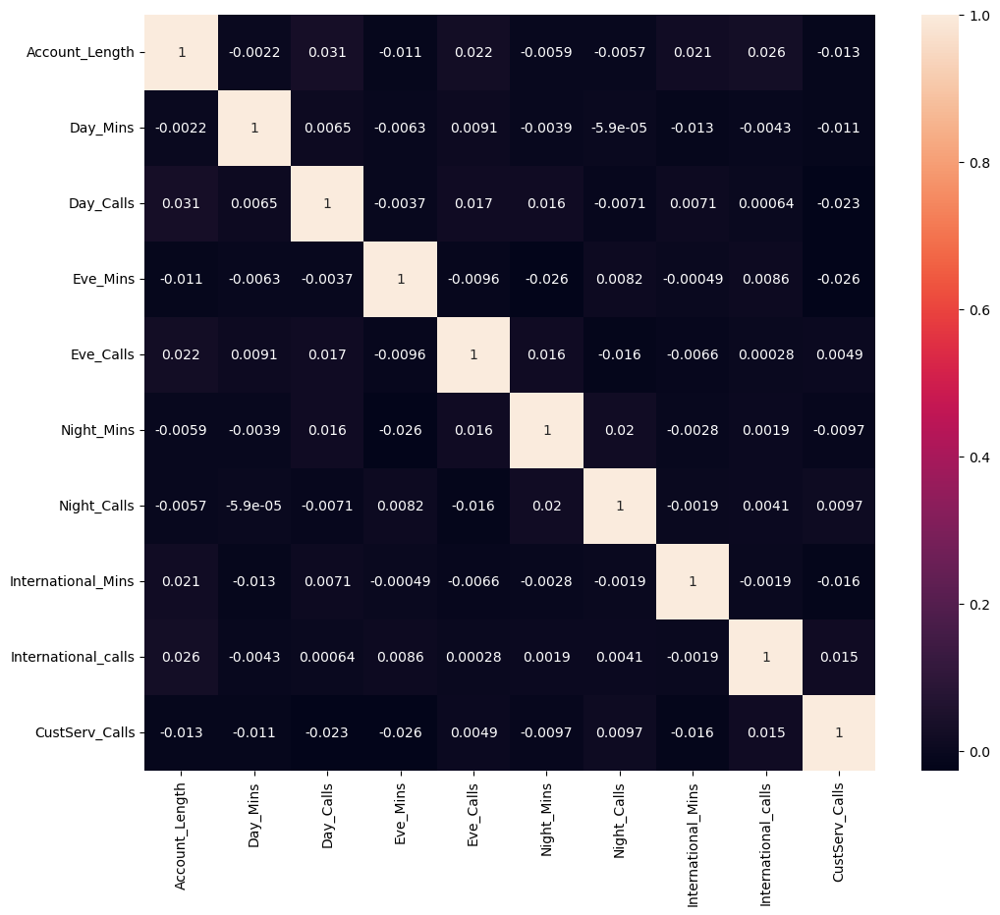

In [232]:
plt.figure(figsize=(12,10))
sns.heatmap(df2.corr(),annot=True)

### INSIGHTS:-  
* The column "Day_Charge" exhibited a high correlation with the "Day_Mins" column. Similarly, the "Eve_Charge" column displayed a strong correlation with the "Eve_Mins" column.
* Additionally, the "Night_Charge" column showed a notable correlation with the "Night_Mins" column. Moreover, the "International_Charge" column demonstrated a significant correlation with the "International_Mins" column.
* Due to these high correlations, one of the paired columns was removed to avoid multicollinearity in the dataset.

In [233]:
df2

,Account_Length,Day_Mins,Day_Calls,Eve_Mins,Eve_Calls,Night_Mins,Night_Calls,International_Mins,International_calls,CustServ_Calls
0,0.622549,0.789835,0.596154,0.489879,0.485981,0.661982,0.413462,0.474820,0.3,0.333333
1,0.519608,0.434409,0.721154,0.482886,0.523364,0.697855,0.528846,0.741007,0.3,0.333333
2,0.666667,0.715316,0.634615,0.209422,0.588785,0.358358,0.538462,0.633094,0.5,0.000000
3,0.406863,0.907624,0.221154,0.499131,0.383178,0.485207,0.394231,0.230216,0.7,0.666667
4,0.362745,0.451923,0.625000,0.309165,0.700935,0.448225,0.701923,0.482014,0.3,1.000000
...,...,...,...,...,...,...,...,...,...,...
4612,0.274510,0.373970,0.317308,0.452337,0.607477,0.343565,0.711538,0.366906,0.6,1.000000
4613,0.862745,0.528503,0.413462,0.878911,0.457944,0.362056,0.653846,0.884892,0.1,1.000000
4614,0.323529,0.317308,0.750000,0.853147,0.766355,0.500000,0.413462,0.690647,0.3,0.333333
4615,0.475490,0.459478,0.480769,0.596246,0.654206,0.369083,0.461538,0.784173,0.3,0.000000


In [234]:
final_data = pd.concat([df2, data[['International_Plan', 'VMail_Plan', 'Churn']]], axis=1)
final_data

,Account_Length,Day_Mins,Day_Calls,Eve_Mins,Eve_Calls,Night_Mins,Night_Calls,International_Mins,International_calls,CustServ_Calls,International_Plan,VMail_Plan,Churn
0,0.622549,0.789835,0.596154,0.489879,0.485981,0.661982,0.413462,0.474820,0.3,0.333333,False,True,False
1,0.519608,0.434409,0.721154,0.482886,0.523364,0.697855,0.528846,0.741007,0.3,0.333333,False,True,False
2,0.666667,0.715316,0.634615,0.209422,0.588785,0.358358,0.538462,0.633094,0.5,0.000000,False,False,False
3,0.406863,0.907624,0.221154,0.499131,0.383178,0.485207,0.394231,0.230216,0.7,0.666667,True,False,False
4,0.362745,0.451923,0.625000,0.309165,0.700935,0.448225,0.701923,0.482014,0.3,1.000000,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,0.274510,0.373970,0.317308,0.452337,0.607477,0.343565,0.711538,0.366906,0.6,1.000000,False,True,False
4613,0.862745,0.528503,0.413462,0.878911,0.457944,0.362056,0.653846,0.884892,0.1,1.000000,False,True,False
4614,0.323529,0.317308,0.750000,0.853147,0.766355,0.500000,0.413462,0.690647,0.3,0.333333,False,True,False
4615,0.475490,0.459478,0.480769,0.596246,0.654206,0.369083,0.461538,0.784173,0.3,0.000000,False,True,False


### DATA ANALYSIS REPORT 

* The dataset contains 4617 entries and 21 columns, with no missing values.
  
* Unnecessary columns like "State," "Area_Code," and "Phone" were identified and deemed irrelevant for analysis. Categorical columns, "International_Plan," "VMail_Plan," and "Churn," were one-hot encoded.
* The specified numeric columns were scaled, excluding the encoded categorical variables. Correlation analysis revealed high correlations between "Day_Charge" and "Day_Mins," "Eve_Charge" and "Eve_Mins," "Night_Charge" and "Night_Mins," and "International_Charge" and "International_Mins."
*  To mitigate multicollinearity, one column from each correlated pair was removed. The dataset is now prepared for further analysis.

## **DEFINE INDEPENDENT & DEPENDENT FEATURES**

In [235]:
## Creating independent and dependent variable
X=final_data.iloc[:,:-1]
y=final_data.Churn


In [236]:
X

,Account_Length,Day_Mins,Day_Calls,Eve_Mins,Eve_Calls,Night_Mins,Night_Calls,International_Mins,International_calls,CustServ_Calls,International_Plan,VMail_Plan
0,0.622549,0.789835,0.596154,0.489879,0.485981,0.661982,0.413462,0.474820,0.3,0.333333,False,True
1,0.519608,0.434409,0.721154,0.482886,0.523364,0.697855,0.528846,0.741007,0.3,0.333333,False,True
2,0.666667,0.715316,0.634615,0.209422,0.588785,0.358358,0.538462,0.633094,0.5,0.000000,False,False
3,0.406863,0.907624,0.221154,0.499131,0.383178,0.485207,0.394231,0.230216,0.7,0.666667,True,False
4,0.362745,0.451923,0.625000,0.309165,0.700935,0.448225,0.701923,0.482014,0.3,1.000000,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...
4612,0.274510,0.373970,0.317308,0.452337,0.607477,0.343565,0.711538,0.366906,0.6,1.000000,False,True
4613,0.862745,0.528503,0.413462,0.878911,0.457944,0.362056,0.653846,0.884892,0.1,1.000000,False,True
4614,0.323529,0.317308,0.750000,0.853147,0.766355,0.500000,0.413462,0.690647,0.3,0.333333,False,True
4615,0.475490,0.459478,0.480769,0.596246,0.654206,0.369083,0.461538,0.784173,0.3,0.000000,False,True


In [237]:
y

0       False
1       False
2       False
3       False
4       False
        ...  
4612    False
4613    False
4614    False
4615    False
4616    False
Name: Churn, Length: 4617, dtype: bool

In [238]:
final_data.Churn.value_counts()

Churn
False    3961
True      656
Name: count, dtype: int64

## **SPLIT TRAINING AND TESTING DATA**

In [270]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=45)

In [271]:
y_train.value_counts()

Churn
False    3169
True      524
Name: count, dtype: int64

## **USE SMOTE TECHNIQUE**

In [272]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()
X_train_smote, y_train_smote = smote.fit_resample(X_train,y_train)

In [273]:
y_train_smote.value_counts()

Churn
False    3169
True     3169
Name: count, dtype: int64

# **MODEL CREATION**

## **LOGISTIC REGRESSION**

In [274]:
# Step:1 importing library
from sklearn.linear_model import LogisticRegression

# Step:2 Object creation
log_model = LogisticRegression()

# Step:3 Fitting the training data
log_model.fit(X_train,y_train)

# Step:4 Prediction on test data
y_log_predict = log_model.predict(X_test)

# Step:5 Prediction on training data
train_log_predict = log_model.predict(X_train)

## EVALUATION
## TRAINING ACCURACY

In [275]:
# importing library
from sklearn.metrics import accuracy_score,recall_score,f1_score,classification_report
log_train_accuracy = accuracy_score(train_log_predict,y_train)
print("Training accuracy of Logistic regression model",log_train_accuracy*100)
print("Logistic regression training Classification report: \n",classification_report(train_log_predict,y_train))

Training accuracy of Logistic regression model 86.37963715136745
Logistic regression training Classification report: 
               precision    recall  f1-score   support

       False       0.99      0.87      0.93      3584
        True       0.12      0.60      0.21       109

    accuracy                           0.86      3693
   macro avg       0.56      0.73      0.57      3693
weighted avg       0.96      0.86      0.90      3693



In [278]:
from sklearn.metrics import f1_score,accuracy_score,recall_score,precision_score,classification_report

from sklearn.linear_model import LogisticRegression
LR = LogisticRegression()
LR.fit(X_train_smote,y_train_smote)
LR_y_train_predict=LR.predict(X_test)
accuracy = accuracy_score(y_test,LR_y_train_predict)
print("Accuracy:",accuracy*100,"%")

classification = classification_report(y_test,LR_y_train_predict)
print("\n",classification)

Accuracy: 70.12987012987013 %

               precision    recall  f1-score   support

       False       0.92      0.71      0.80       792
        True       0.27      0.65      0.38       132

    accuracy                           0.70       924
   macro avg       0.60      0.68      0.59       924
weighted avg       0.83      0.70      0.74       924



##  CROSS VALIDATION ON LOGISTIC REGRESSION

In [279]:
from sklearn.model_selection import cross_val_score

# Perform cross-validation and compute accuracy scores
scores = cross_val_score(LR, X, y, cv=10, scoring='accuracy')

print("Cross Validation Score of Logistic Regression:", scores.mean())
print("Std:", scores.std())

Cross Validation Score of Logistic Regression: 0.8613840606248415
Std: 0.00915459685466113


## GRID SEARCH CV ON LOGISTIC REGRESSION(HYPERPARATMETER TUNING)

In [280]:
from sklearn.model_selection import GridSearchCV

# Define the hyperparameter grid
param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100],
              'penalty': ['l1', 'l2']}

# Create a logistic regression model
LR = LogisticRegression()

# Create GridSearchCV object
grid_search = GridSearchCV(LR, param_grid, cv=10, scoring='accuracy')

# Fit the grid search to the data
grid_search.fit(X, y)

# Print the best hyperparameters and corresponding accuracy
print("Best Hyperparameters:", grid_search.best_params_)

Best Hyperparameters: {'C': 0.1, 'penalty': 'l2'}


## LOGISTIC REGRESSION WITH BEST PARAMETER

In [193]:
dt1 = LogisticRegression(C=0.1, penalty='l2')

# Fit the model to the training data
dt1.fit(X_train,y_train)

# Make predictions on the test data
y_hat1 = dt1.predict(X_test)

# Calculate and print the accuracy
acc2 = accuracy_score(y_test, y_hat1)
print("Accuracy:", acc2 * 100, "%")

Accuracy: 86.47186147186147 %


## **SVM (Support Vector Machine)** 

In [224]:
# Support Vector Machine

from sklearn.svm import SVC
svc = SVC()
svc.fit(X_train_smote, y_train_smote)
y_hat = svc.predict(X_test)
accuracy = accuracy_score(y_test, y_hat)
print("Accuracy:",accuracy*100,"%")

classification = classification_report(y_test, y_hat)
print("\n",classification)

Accuracy: 85.4978354978355 %

               precision    recall  f1-score   support

           0       0.94      0.89      0.91       799
           1       0.47      0.64      0.54       125

    accuracy                           0.85       924
   macro avg       0.71      0.76      0.73       924
weighted avg       0.88      0.85      0.86       924



## CROSS VALIDATION ON  SVC

In [225]:
# Perform cross-validation and compute accuracy scores
from sklearn.model_selection import cross_val_score

scores = cross_val_score(svc, X, y, cv=10, scoring='accuracy')

print("Cross Validation Score of SVC:", scores.mean())
print("Std:", scores.std())


Cross Validation Score of SVC: 0.8906245598219569
Std: 0.007417126648593285


## **KNN (K-Nearest Neighbor)** 


Accuracy: 87.66233766233766 %

               precision    recall  f1-score   support

           0       0.98      0.88      0.92       799
           1       0.53      0.86      0.65       125

    accuracy                           0.88       924
   macro avg       0.75      0.87      0.79       924
weighted avg       0.92      0.88      0.89       924



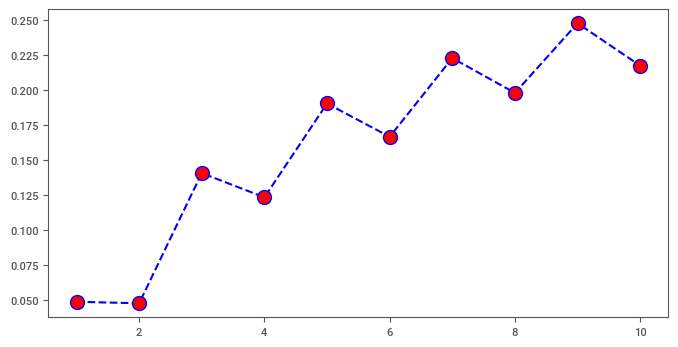

In [199]:
# Knn 

import warnings
warnings.filterwarnings('ignore')
from sklearn.neighbors import KNeighborsClassifier
error_rate =[]
for i in range(1,11):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train_smote, y_train_smote)
    y_new = knn.predict(X_test)
    error_rate.append(np.mean(y_new != y_test))
    
plt.figure(figsize=(8,4))
plt.plot(range(1,11),error_rate, color='blue', linestyle='dashed', marker='o', markerfacecolor='red', markersize=10)

knn1 = KNeighborsClassifier(n_neighbors=4)
knn1.fit(X_train_smote, y_train_smote)
y_new = knn1.predict(X_test)
accuracy = accuracy_score(y_test, y_new)
print("Accuracy:",accuracy*100,"%")

classification = classification_report(y_test, y_new)
print("\n",classification)

## CROSS VALIDATION ON KNN

In [200]:
# Perform cross-validation and compute accuracy scores
scores = cross_val_score(knn1, X, y, cv=10, scoring='accuracy')

# Print the results
print("Cross Validation Score of KNN:", scores.mean())
print("Std:", scores.std())


Cross Validation Score of KNN: 0.8735137241644834
Std: 0.011731552973331597


## GRIDSEARCH CV ON KNN (HYPERPARAMETER TUNING)

In [201]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# Create a kNN pipeline with a scaler
knn_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsClassifier())
])

# Define the hyperparameter grid
param_grid = {
    'knn__n_neighbors': [1, 3, 5, 7, 9],  # Adjust based on your problem
    'knn__weights': ['uniform', 'distance'],
    'knn__p': [1, 2]  # 1 for Manhattan distance, 2 for Euclidean distance
}

# Create a GridSearchCV object
grid_search = GridSearchCV(knn_pipeline, param_grid, cv=5, scoring='accuracy')

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and corresponding accuracy
print("Best Hyperparameters:", grid_search.best_params_)

Best Hyperparameters: {'knn__n_neighbors': 9, 'knn__p': 1, 'knn__weights': 'uniform'}


## KNN WITH BEST PARAMETER

In [202]:
# Create a kNN model with specified hyperparameters
dt1 = KNeighborsClassifier(n_neighbors=9, p=1, weights='uniform')

# Fit the model to the training data
dt1.fit(X_train, y_train)

# Make predictions on the test data
y_hat1 = dt1.predict(X_test)

# Calculate and print the accuracy
acc2 = accuracy_score(y_test, y_hat1)
print("Accuracy:", acc2 * 100, "%")

Accuracy: 88.52813852813853 %


## **DECISION TREE CLASSIFIER**

In [203]:
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier() 
dt.fit(X_train_smote, y_train_smote)
y_hat=dt.predict(X_test)
accuracy = accuracy_score(y_test, y_hat)
print("Accuracy:",accuracy*100,"%")

classification = classification_report(y_test, y_hat)
print("\n",classification)

Accuracy: 96.53679653679653 %

               precision    recall  f1-score   support

           0       0.98      0.98      0.98       799
           1       0.85      0.90      0.88       125

    accuracy                           0.97       924
   macro avg       0.92      0.94      0.93       924
weighted avg       0.97      0.97      0.97       924



## CROSS VALIDATION ON DECISION TREE

In [204]:
# Perform cross-validation and compute accuracy scores
scores = cross_val_score(dt, X, y, cv=10, scoring='accuracy')

# Print the results
print("Cross Validation Score of Decision Tree Classifier:", scores.mean())
print("Std:", scores.std())


Cross Validation Score of Decision Tree Classifier: 0.860084420279648
Std: 0.01755557868063522


## GRIDSEARCH CV ON DECESION TREE (HYPERPARAMETER TUNING) 

In [205]:
from sklearn.model_selection import GridSearchCV

params = {
    'criterion': ['gini', 'entropy'], 
    'splitter': ['best', 'random'],  
    'max_depth': [None, 5, 10, 15],  
    'min_samples_split': [2, 5, 10],  
    'min_samples_leaf': [1, 2, 4] 
}

tree_clf = DecisionTreeClassifier(random_state=3)

tree_cv = GridSearchCV(estimator=tree_clf, param_grid=params, cv=5)

tree_cv.fit(X_train_smote,y_train_smote)

best_params = tree_cv.best_params_ 

print(f"Best paramters: {best_params})")

Best paramters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'})


## DECISION TREE CLASSIFIER WITH BEST PARAMETER 

In [207]:
dt1=DecisionTreeClassifier(criterion= 'entropy', max_depth= None, min_samples_leaf= 1, min_samples_split= 2, splitter= 'best')
dt1.fit(X_train,y_train)
y_hat1=dt1.predict(X_test)
acc2=accuracy_score(y_test,y_hat1)
print("Accuracy:",acc2*100,"%")

Accuracy: 85.4978354978355 %


## **RANDOM FOREST CLASSIFIER**

In [208]:
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier#importing randomforest

rf_clf = RandomForestClassifier(n_estimators=100)#object creation ,taking 100 decision tree in random forest 
rf_clf.fit(X_train_smote,y_train_smote)
y_predict=rf_clf.predict(X_test)
acc2=accuracy_score(y_test,y_predict)
print("Accuracy:",acc2*100,"%")

classification = classification_report(y_test, y_predict)
print("\n",classification)

Accuracy: 97.51082251082252 %

               precision    recall  f1-score   support

           0       0.98      0.99      0.99       799
           1       0.93      0.89      0.91       125

    accuracy                           0.98       924
   macro avg       0.95      0.94      0.95       924
weighted avg       0.97      0.98      0.97       924



## CROSS VALIDATION ON RANDOM FOREST CLASSIFIER

In [209]:
# Perform cross-validation and compute accuracy scores
scores = cross_val_score(rf_clf, X, y, cv=10, scoring='accuracy')

# Print the results
print("Cross Validation Score of Random Forest:", scores.mean())
print("Std:", scores.std())


Cross Validation Score of Random Forest: 0.9218117023973857
Std: 0.01017039245478144


# RANDOM SEARCH CV WITH RANDOM FOREST CLASSIFIER (HYPERPARAMETER TUNING )

In [210]:
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int(x) for x in np.linspace(start=200, stop=2000, num=10)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num=11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]

#dictionary for hyperparameters
random_grid = {'n_estimators': n_estimators, 'max_features': max_features,
               'max_depth': max_depth, 'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf, 'bootstrap': bootstrap}

rf_clf1 = RandomForestClassifier(random_state=42)#model

rf_cv = RandomizedSearchCV(estimator=rf_clf1, scoring='f1',param_distributions=random_grid, n_iter=100, cv=3, 
                               verbose=1, random_state=42, n_jobs=-1)

rf_cv.fit(X_train, y_train)
rf_best_params = rf_cv.best_params_##it will give you best parameters 
print(f"Best params: {rf_best_params})")

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best params: {'n_estimators': 1400, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 40, 'bootstrap': False})


## RANDOM FOREST WITH BEST PARAMETER

In [211]:
rf_clf2 = RandomForestClassifier(n_estimators= 1400, min_samples_split= 2, min_samples_leaf= 1, max_features= 'auto', max_depth= 40, bootstrap= False) #passing best parameter to randomforest
rf_clf2.fit(X_train_smote, y_train_smote) #training 
y_predict=rf_clf2.predict(X_test) #testing
acc=accuracy_score(y_test,y_predict)
print("Accuracy:",acc*100,"%")

Accuracy: 97.83549783549783 %


## **GRADIENT BOOSTING**

In [212]:
from sklearn.ensemble import GradientBoostingClassifier
gbm=GradientBoostingClassifier() ## object creation
gbm.fit(X_train_smote,y_train_smote) ## fitting the data
y_gbm=gbm.predict(X_test)
accu_scor=accuracy_score(y_test,y_gbm)
print("Accuracy:",accu_scor*100,"%")

classification = classification_report(y_test, y_gbm)
print("\n",classification)

Accuracy: 91.23376623376623 %

               precision    recall  f1-score   support

           0       0.93      0.97      0.95       799
           1       0.73      0.55      0.63       125

    accuracy                           0.91       924
   macro avg       0.83      0.76      0.79       924
weighted avg       0.91      0.91      0.91       924



## CROS VALIDATION ON GRADIENT BOOSTING

In [213]:
# Perform cross-validation and compute accuracy scores
scores = cross_val_score(gbm, X, y, cv=10, scoring='accuracy')

# Print the results
print("Cross Validation Score of Gradient Boosting:", scores.mean())
print("Std:", scores.std())


Cross Validation Score of Gradient Boosting: 0.923110873219333
Std: 0.011048582751289126


# GRID SEARCH CV ON GRADIENT BOOSTING(HYPERPARAMETER TUNING)

In [214]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming X and y are your feature matrix and target vector
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Gradient Boosting Classifier
gb_clf = GradientBoostingClassifier()

# Define the hyperparameter grid
param_grid = {
    'n_estimators': [50, 100, 150],  # Number of boosting stages to be run
    'learning_rate': [0.05, 0.1, 0.2],  # Step size shrinkage used to prevent overfitting
    'max_depth': [3, 4, 5],  # Maximum depth of the individual trees
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required to be at a leaf node
}

# Create a GridSearchCV object
grid_search = GridSearchCV(gb_clf, param_grid, cv=5, scoring='accuracy')

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and corresponding accuracy
print("Best Hyperparameters:", grid_search.best_params_)


Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}


## GRADIENT BOOSTING WITH BEST PARAMETER 

In [215]:
GB2 = GradientBoostingClassifier(learning_rate=0.2, max_depth= 5, min_samples_leaf=4, min_samples_split= 2, n_estimators= 100) #passing best parameter to randomforest
rf_clf2.fit(X_train_smote, y_train_smote) #training 
y_predict=rf_clf2.predict(X_test) #testing
acc=accuracy_score(y_test,y_predict)
print("Accuracy:",acc*100,"%")

Accuracy: 98.05194805194806 %


## **XGBOOST**  

In [216]:
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report

# Assuming X_train_smote and y_train_smote are preprocessed and represent your training data
# Use LabelEncoder to transform class labels
label_encoder = LabelEncoder()
y_train_smote_encoded = label_encoder.fit_transform(y_train_smote)

# Create an XGBoost classifier
xgb_r = XGBClassifier()

# Fit the model to the training data
xgb_r.fit(X_train_smote, y_train_smote_encoded)

# Assuming X_test is preprocessed and represents your test data
# Transform the class labels in y_test using the same label encoder
y_test_encoded = label_encoder.transform(y_test)

# Make predictions on the test data
y_hat = xgb_r.predict(X_test)

# Calculate and print the accuracy
accu_scor = accuracy_score(y_test_encoded, y_hat)
print("Accuracy:", accu_scor * 100, "%")

# Display the classification report
classification = classification_report(y_test_encoded, y_hat)
print("\n", classification)

Accuracy: 97.94372294372295 %

               precision    recall  f1-score   support

           0       0.98      0.99      0.99       799
           1       0.96      0.89      0.92       125

    accuracy                           0.98       924
   macro avg       0.97      0.94      0.95       924
weighted avg       0.98      0.98      0.98       924



## CROS VALIDATION ON XGBOOST

In [217]:
cv_scores = cross_val_score(xgb_r, X_train_smote, y_train_smote_encoded, cv=5)  # You can adjust the number of folds with the 'cv' parameter

# Print the cross-validation scores
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Accuracy:", cv_scores.mean())

Cross-Validation Scores: [0.85252366 0.96608833 0.97239748 0.97553275 0.9652723 ]
Mean CV Accuracy: 0.9463629030049372


## GRID SEARCH CV ON  XGBOOST (HYPERPARAMETER TUNING )

In [218]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
import numpy as np

# Create an XGBoost classifier
xgb_classifier = XGBClassifier()

# Define a parameter grid to search
param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_classifier, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Print the best parameters and corresponding accuracy
print("Best Parameters:", grid_search.best_params_)


Best Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}


# XGBOOST WITH BEST HYPERPARAMETER 

In [219]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

# Assuming you have X_train_smote, y_train_smote, X_test, and y_test defined

# Create an XGBoost classifier with the specified parameters
xgb_clf = XGBClassifier(
    colsample_bytree=1.0,
    learning_rate=0.2,
    max_depth=5,
    n_estimators=50,
    subsample=1.0
)

# Fit the XGBoost classifier to the SMOTE training data
xgb_clf.fit(X_train, y_train)

# Make predictions on the test data
y_predict = xgb_clf.predict(X_test)

# Calculate and print the accuracy
acc = accuracy_score(y_test, y_predict)
print("Accuracy:", acc * 100, "%")

Accuracy: 92.42424242424242 %


###  ANN (Artificial Neural Network)

In [220]:
from sklearn.neural_network import MLPClassifier
model = MLPClassifier( hidden_layer_sizes=(50,3),
                       learning_rate_init=0.1,
                       max_iter=100,
                       random_state=2)
model.fit(X_train_smote,y_train_smote) 
y_predict = model.predict(X_test)
print("Accuracy :",accuracy_score(y_test,y_predict)*100,"%")

classification = classification_report(y_test, y_predict)
print("\n",classification)

Accuracy : 13.528138528138529 %

               precision    recall  f1-score   support

           0       0.00      0.00      0.00       799
           1       0.14      1.00      0.24       125

    accuracy                           0.14       924
   macro avg       0.07      0.50      0.12       924
weighted avg       0.02      0.14      0.03       924



### CROSS VALIDATION ON ANN

In [221]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, accuracy_score

# Your data (X_train_smote, y_train_smote, X_test, y_test) should be defined before this point

# Create the MLPClassifier
model = MLPClassifier(hidden_layer_sizes=(50, 3),
                      learning_rate_init=0.1,
                      max_iter=100,
                      random_state=2)

# Perform cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)  # You can adjust the number of folds with the 'cv' parameter

# Print the results
print("Cross Validation Score of ANN:", scores.mean())
print("Std:", scores.std())

Cross Validation Score of ANN: 0.923110873219333
Std: 0.011048582751289126


### GRID SEARCH CV ON XGBOOST (HYPERPARAMETER TUNING) 

In [222]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score

# Your data (X_train_smote, y_train_smote, X_test, y_test) should be defined before this point

# Create the MLPClassifier
model = MLPClassifier(random_state=2)

# Define the hyperparameter grid to search
param_grid = {
    'hidden_layer_sizes': [(50, 3), (100, 3), (50, 50, 3)],
    'learning_rate_init': [0.001, 0.01, 0.1],
    'max_iter': [50, 100, 150],
}

# Create the GridSearchCV object
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy')

# Fit the GridSearchCV object to the data
grid_search.fit(X_train_smote, y_train_smote)

# Print the best hyperparameters found
print("Best Hyperparameters:", grid_search.best_params_)

Best Hyperparameters: {'hidden_layer_sizes': (50, 50, 3), 'learning_rate_init': 0.01, 'max_iter': 150}


## ANN WITH BEST PARAMETER

In [223]:
ANN2 = MLPClassifier(hidden_layer_sizes= (50,50,3), learning_rate_init= 0.01, max_iter=150) #passing best parameter to randomforest
rf_clf2.fit(X_train_smote, y_train_smote) #training 
y_predict=rf_clf2.predict(X_test) #testing
acc=accuracy_score(y_test,y_predict)
print("Accuracy:",acc*100,"%")

Accuracy: 97.94372294372295 %


## MODEL COMAPRISION REPORT

* Logistic Regression :- 71.21%
* Cross validation on logistic regression :- 86.26%
* Logistic Regression with best hyperparameter :- 86.47%


* Support Vector Machine :- 85.49%
* Cross validation on SVM :- 89.06% 


* K-Nearest Neighbor :- 87.66% 
* Cross validation on KNN :- 87.35%
* K-Nearest Neighbor with best hyperparameter :- 88.52%

* Decision Tree Classifier :- 96.53% 
* Cross validation on Decision Tree Classifier :- 86.00%
* Decision Tree with best hyperparameter :- 85.49%


* Random Forest Classifier :- 97.51%
* Cross validation on Random Forest Classifier :- 92.18%
* Random Forest with best hyperparameter :- 97.83%


* Gradient Boosting :- 91.23%
* Cross validation on Gradient Boosting :- 92.31% 
* Gradient Boosting with best hyperparameter :- 98.05%

* XGBoost :- 97.94%
* Cross validation on XGBoost :- 94.63%
* XGBoost with best hyperparameter :- 92.42%


* Artificial Neural Network :- 13.52%
* Cross validation on  ANN :- 92.31%
* ANN with best hyperparameter :- 97.94%


##### The best accuracy is given by the  Gradient Boosting with best hyperparameter  i.e. 98.05%

### OUTPUT BASED ON MANUAL IMPUTATION OF INPUT VALUES 

In [228]:
import numpy as np

a = eval(input("Enter Account_Length value: "))
b = eval(input("Enter Day_Mins value: "))
c = eval(input("Enter Day_Calls value: "))
d = eval(input("Enter Eve_Mins value: "))
e = eval(input("Enter Eve_Calls value: "))
f = eval(input("Enter Night_Mins value: "))
g = eval(input("Enter Night_Calls value: "))
h = eval(input("Enter International_Mins value: "))
i =  eval(input("Enter International_calls value: "))
j =  eval(input("Enter CustServ_Calls value: "))
k =  eval(input("Enter International_Plan value: "))
l =  eval(input("Enter VMail_Plan value: "))

# Create a numpy array with all 9 values
values = np.array([a, b, c, d, e, f, g, h, i, j, k, l])

# Assuming xgb2 is your trained XGBoost model
predict = rf_clf2.predict(values.reshape(1, -1))  # Reshape to a 2D array

print("The Churn is:", predict)

Enter Account_Length value: 0.622549
Enter Day_Mins value: 0.789835
Enter Day_Calls value: 0.595154
Enter Eve_Mins value: 0.542755
Enter Eve_Calls value: 0.330189
Enter Night_Mins value: 0.661982
Enter Night_Calls value: 0.413462
Enter International_Mins value: 0.474820
Enter International_calls value: 0.3
Enter CustServ_Calls value: 0.333333
Enter International_Plan value: 0
Enter VMail_Plan value: 1
The Churn is: [0]


## **CONCLUSION**

**In the "NO-churn telecom" dataset comprising 4617 entries, the Gradient Boosting model, fine-tuned with the best hyperparameters, demonstrated an exceptional accuracy of 98.05%.**

**This signifies the effectiveness of Gradient Boosting in accurately predicting churn within the telecommunications dataset. The high accuracy underscores the model's robust performance and suitability for deployment in predicting customer churn.**

**Careful consideration should be given to potential applications in real-world scenarios, and further analysis may be conducted to ensure the model's reliability and generalizability.**